## Progrnostication
#### Homework 1
Sofiia Petryshyn, variant 3

## Overview

* In the next cell you can see all the libraries that are required, so they need to be installed on your computer.
* Also `jupyter` has to be installed.
    After that you open the directory there this notebook exists, in the same directory `palm_data` directory is supposed to be.
    In the `plam_data` there are some files, such as `area_good.csv`, `production_good.csv`, `rainfall_good.csv`. Those are the dataset for our research.
    From this directory type in cmd: `jupyter notebook` if you use python env, otherwise `jupyter-lab` if you use conda.
* Open the notebook from your browser and run all the cells.
The process of run can take some time, as all the models need to be trained.\
\
In the section `Conclusions` you can see the result of the research.

## 1. Import Python libraries

In [421]:
import numpy as np
import pandas as pd
import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt
matplotlib.rcParams['figure.dpi']= 100
matplotlib.rcParams['figure.figsize'] = 15, 5
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.api import SimpleExpSmoothing
from statsmodels.tsa.api import Holt
from copy import deepcopy
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.api import ExponentialSmoothing
from statsmodels.tsa.arima_model import ARIMA
#ACF and PACF plots:
from statsmodels.tsa.stattools import acf, pacf
import plotly.express as px

from fbprophet import Prophet
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error
from keras.models import Sequential
from keras.layers import Dense, Dropout, TimeDistributed, Conv1D, MaxPooling1D, Flatten, RepeatVector
from keras.layers import LSTM
from keras.optimizers import Adam, Adagrad

from hyperas import optim
from hyperas.distributions import choice, uniform
from hyperopt import Trials, STATUS_OK, tpe, rand

## 2. Import the data

In [2]:
production = pd.read_csv('palm_data/production_good.csv')
rainfall = pd.read_csv('palm_data/rainfall_good.csv')
area = pd.read_csv('palm_data/area_good.csv')

In [3]:
production.head()

,index,Region,Year,Month,Production,Diff_production
0,0,JH,1998,1,118.359,0.000
1,1,JH,1998,2,147.988,0.000
2,2,JH,1998,3,145.514,29.629
3,3,JH,1998,4,154.638,-2.474
4,4,JH,1998,5,155.827,9.124


In [4]:
rainfall.tail()

,Region,Year,Month,Rainfall
3439,Sarawak,2016,12,274.18
3440,Sarawak,2017,12,0.00
3441,Sarawak,2018,12,0.00
3442,Sarawak,2019,12,0.00
3443,Sarawak,2020,12,0.00


In [5]:
area.head()

,Area_New,Area_ma,Area_ma_new,Area_npa,Area_rpa,Region,Year
0,0.0,0.0,0.000000,0.0,0.0,JH,1974
1,59.0,128.0,128.000000,187.0,0.0,JH,1975
2,59.0,147.0,147.000000,206.0,0.0,JH,1976
3,56.0,171.0,116.538462,227.0,0.0,JH,1977
4,59.0,191.0,93.423077,250.0,0.0,JH,1978


## 3. Cleanup the data

In [6]:
RAINFALL_LAGS = [6, 7, 8, 9, 10, 11, 12]
PRODUCTION_LAGS = [6, 7, 8, 9, 10, 11, 12]
region = ['OtherPEN', 'Other Pen. States', 'OtherPEN']

In [7]:
def process_data(production, rainfall, area, region, PRODUCTION_LAGS, RAINFALL_LAGS):
    output = {}
    data = production[production.Region == region[0]]
    data = pd.merge(data[['Year', 'Month', 'Production', 'Diff_production']],
                    rainfall[rainfall.Region == region[1]][['Year', 'Month', 'Rainfall']], 
                    on=['Year', 'Month'], how='left')

    data = pd.merge(data, area[area.Region == region[2]][
        ['Year', 'Area_ma', 'Area_npa', 'Area_rpa', 'Area_New', 'Area_ma_new']], on='Year', how='left')

    data['Year'] = data['Year'].astype(int)
    data['Month'] = data['Month'].astype(int)
    data.reset_index(inplace=True)

    data.set_index([pd.to_datetime(['{0}-{1}-01'.format(x, y) for (x, y) in zip(data.Year, data.Month)])],
                   inplace=True)

    data.drop(['index', 'Year', 'Area_New', 'Diff_production'], axis=1, inplace=True)
    data['Time'] = np.arange(len(data))

    for lag in RAINFALL_LAGS:
        temp = np.concatenate((np.array([np.nan for _ in range(lag)]), data.Rainfall.values[:-lag]))
        data['Rainfall_{0}'.format(lag)] = temp

    for lag in PRODUCTION_LAGS:
        temp = np.concatenate((np.array([np.nan for _ in range(lag)]), data.Production.values[:-lag]))
        data['Production_{0}'.format(lag)] = temp

    PRODUCTION = data.Production
    data.drop(['Production'], axis=1, inplace=True)

    data.fillna(data.mean(), inplace=True)

    #  And finally drop rainfalls
    data.drop(['Rainfall'], axis=1, inplace=True)
    ### HERE I CAN ADD FEATURE ENGINEERING!!!

    #  And clip first year
    for col in data.columns:
        data['_'.join([region[1], str(col)])] = data[col]
        data.drop([col], axis=1, inplace=True)

    output[region[1]] = (data[max(PRODUCTION_LAGS):], PRODUCTION[max(PRODUCTION_LAGS):])
    return output


In [8]:
DATA_df = process_data(production, rainfall, area, region, PRODUCTION_LAGS, RAINFALL_LAGS)[region[1]][0]
DATA_start = process_data(production, rainfall, area, region, PRODUCTION_LAGS, RAINFALL_LAGS)[region[1]][1]

In [9]:
# Example of data df, where production is with lags
DATA_df.head()

,Other Pen. States_Month,Other Pen. States_Area_ma,Other Pen. States_Area_npa,Other Pen. States_Area_rpa,Other Pen. States_Area_ma_new,Other Pen. States_Time,Other Pen. States_Rainfall_6,Other Pen. States_Rainfall_7,Other Pen. States_Rainfall_8,Other Pen. States_Rainfall_9,Other Pen. States_Rainfall_10,Other Pen. States_Rainfall_11,Other Pen. States_Rainfall_12,Other Pen. States_Production_6,Other Pen. States_Production_7,Other Pen. States_Production_8,Other Pen. States_Production_9,Other Pen. States_Production_10,Other Pen. States_Production_11,Other Pen. States_Production_12
1999-01-01,1,528.0,593.0,2.0,401.307692,12,154.201058,154.359681,182.705310,99.763690,118.394494,159.374471,157.849442,143.201,128.955,119.671,113.454,113.573,112.724,89.690
1999-02-01,2,528.0,593.0,2.0,401.307692,13,252.193681,154.201058,154.359681,182.705310,99.763690,118.394494,159.374471,151.091,143.201,128.955,119.671,113.454,113.573,112.724
1999-03-01,3,528.0,593.0,2.0,401.307692,14,174.885872,252.193681,154.201058,154.359681,182.705310,99.763690,118.394494,156.120,151.091,143.201,128.955,119.671,113.454,113.573
1999-04-01,4,528.0,593.0,2.0,401.307692,15,215.828121,174.885872,252.193681,154.201058,154.359681,182.705310,99.763690,141.901,156.120,151.091,143.201,128.955,119.671,113.454
1999-05-01,5,528.0,593.0,2.0,401.307692,16,245.547966,215.828121,174.885872,252.193681,154.201058,154.359681,182.705310,133.885,141.901,156.120,151.091,143.201,128.955,119.671


In [10]:
# Example of numpy array of production, the one we had at the beginning
DATA_start.head()

1999-01-01     92.257
1999-02-01    105.078
1999-03-01    129.949
1999-04-01    166.492
1999-05-01    187.804
Name: Production, dtype: float64

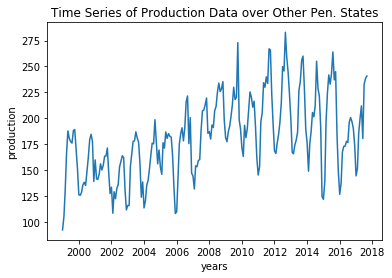

In [11]:
plt.plot(DATA_start.index, DATA_start.values)
plt.title("Time Series of Production Data over " + region[1])
plt.xlabel("years")
plt.ylabel("production");

## 4. Data Decomposition

### Additive Decomposition

In [12]:
ss_decomposition_add = seasonal_decompose(x=DATA_start.values, model='additive', period=20)
estimated_trend_add = ss_decomposition_add.trend
estimated_seasonal_add = ss_decomposition_add.seasonal
estimated_residual_add = ss_decomposition_add.resid

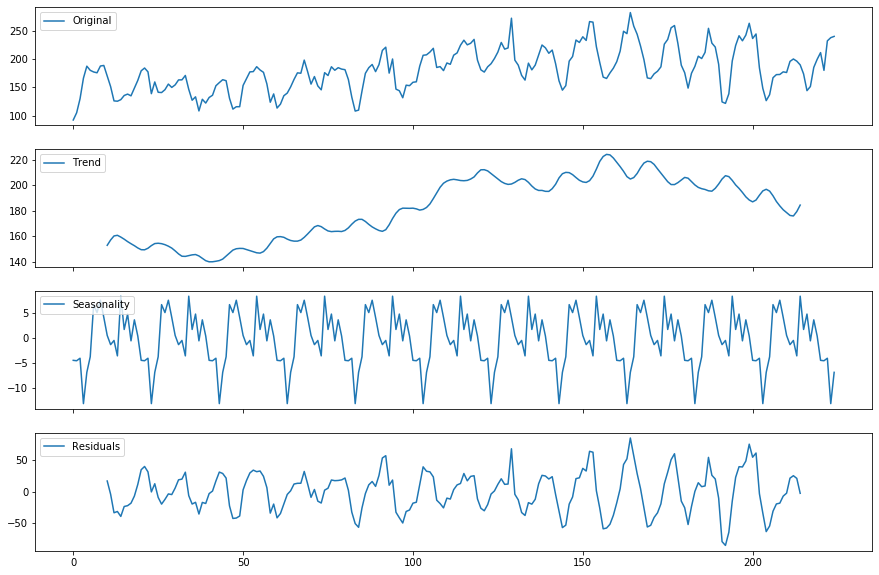

In [13]:
fig, axes = plt.subplots(4, 1, sharex=True, sharey=False)
fig.set_figheight(10)
fig.set_figwidth(15)

axes[0].plot(DATA_start.values, label='Original')
axes[0].legend(loc='upper left');

axes[1].plot(estimated_trend_add, label='Trend')
axes[1].legend(loc='upper left');

axes[2].plot(estimated_seasonal_add, label='Seasonality')
axes[2].legend(loc='upper left');

axes[3].plot(estimated_residual_add, label='Residuals')
axes[3].legend(loc='upper left');

In [14]:
estimated_residual_add = pd.Series(estimated_residual_add, index=DATA_start.index).dropna()

### Multiplicative Decomposition

In [15]:
ss_decomposition_mul = seasonal_decompose(x=DATA_start.values, model='multiplicative', period=20)
estimated_trend_mul = ss_decomposition_mul.trend
estimated_seasonal_mul = ss_decomposition_mul.seasonal
estimated_residual_mul = ss_decomposition_mul.resid

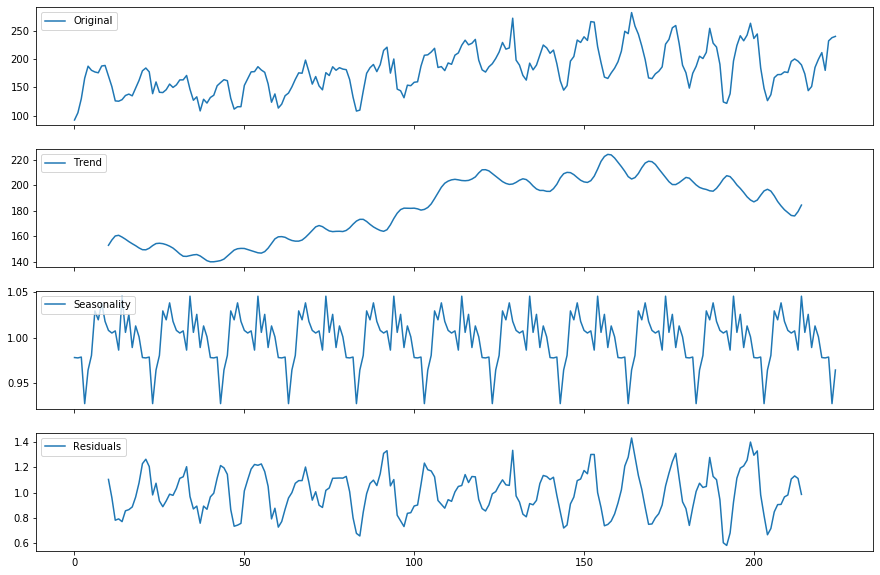

In [16]:
fig, axes = plt.subplots(4, 1, sharex=True, sharey=False)
fig.set_figheight(10)
fig.set_figwidth(15)

axes[0].plot(DATA_start.values, label='Original')
axes[0].legend(loc='upper left');

axes[1].plot(estimated_trend_mul, label='Trend')
axes[1].legend(loc='upper left');

axes[2].plot(estimated_seasonal_mul, label='Seasonality')
axes[2].legend(loc='upper left');

axes[3].plot(estimated_residual_mul, label='Residuals')
axes[3].legend(loc='upper left');

In [17]:
estimated_residual_mul = pd.Series(estimated_residual_mul, index=DATA_start.index).dropna()

#### Plots analysis:
We can say, that the data is applicable as for additive, as for multiplicative decomposition. We have growing trend and stable seasonality.

### Summary Statistics & Plots

In [18]:
chunks = np.array_split(DATA_start, indices_or_sections=10)

In [19]:
# compare means and variances
print("{} | {:7} | {}".format("Chunk", "Mean", "Variance"))
print("-" * 26)
for i, chunk in enumerate(chunks, 1):
    print("{:5} | {:.6} | {:.6}".format(i, np.mean(chunk), np.var(chunk)))

Chunk | Mean    | Variance
--------------------------
    1 | 154.678 | 778.147
    2 | 146.074 | 242.075
    3 | 151.632 | 706.209
    4 | 167.841 | 644.809
    5 | 185.374 | 729.697
    6 | 204.651 | 655.321
    7 | 206.034 | 1107.2
    8 | 215.64 | 1195.72
    9 | 203.758 | 1647.76
   10 | 182.893 | 921.909


#### Statistics analysis:
There is some fluctuation in the data we have, we can actually see it from the plot. The trend tend to increase, so the mean increases, and as the series have multiplicative decomposition, the variance increases as well.

## 5. Stationarity test
#### Augmented Dickey-Fuller Test
We will check if the data is stationary or nonstationary. The **Null Hypothesis** is that the series are **nonstationary**.

In [21]:
def stationarity_test(ts):
    
    rolmean = ts.rolling(12).mean()
    rolstd = ts.rolling(12).std()

    orig = plt.plot(ts, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')

    # Dickey-Fuller test:
    dftest = adfuller(ts, autolag='AIC')
    
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)

Test Statistic                  -1.437191
p-value                          0.564322
#Lags Used                      15.000000
Number of Observations Used    209.000000
Critical Value (1%)             -3.462032
Critical Value (5%)             -2.875471
Critical Value (10%)            -2.574195
dtype: float64


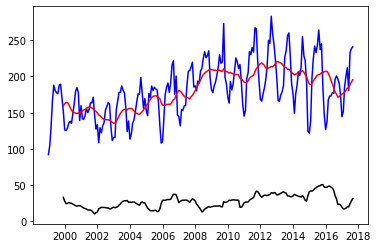

In [22]:
stationarity_test(DATA_start)

#### Test analysis:
`Test Statistic` indicates that we are not really sure that the series are stationary. \
On the other hand, we see `p-value`, that is `0.5`, what means we fail to reject **Null hypothesis** that the data is nonstationary. \
Let's see how we can make the data to become stationary.

### Moving Average

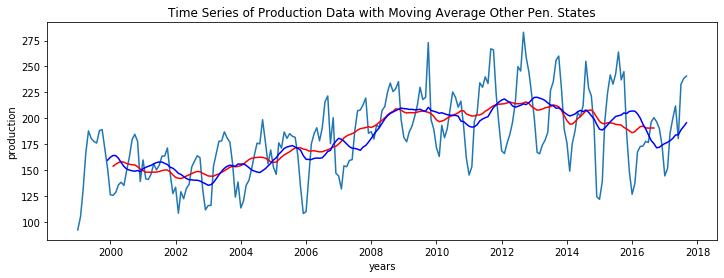

In [23]:
matplotlib.rcParams['figure.figsize'] = 12, 4
DATA_moving_avg_center = DATA_start.rolling(26, center=True).mean()
DATA_moving_avg_right = DATA_start.rolling(12, center=False).mean()
plt.plot(DATA_start)
plt.plot(DATA_moving_avg_center, color='red') # 26
plt.plot(DATA_moving_avg_right, color='blue') # 12
plt.title("Time Series of Production Data with Moving Average " + region[1])
plt.xlabel("years")
plt.ylabel("production");

#### Shocks of moving average

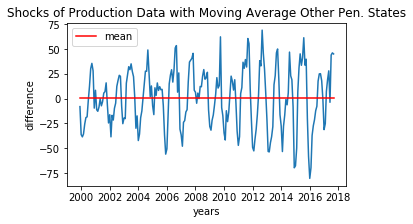

In [24]:
matplotlib.rcParams['figure.figsize'] = 5, 3
DATA_ma_diff = DATA_start.values - DATA_moving_avg_right.values
DATA_ma_diff = pd.Series(DATA_ma_diff, index=DATA_start.index).dropna()
plt.plot(DATA_ma_diff)

sts_avg = np.full(shape=len(DATA_ma_diff), fill_value=np.nanmean(DATA_ma_diff), dtype='float')
plt.plot(DATA_ma_diff.index, sts_avg, 'r', label="mean")
plt.legend()

plt.title("Shocks of Production Data with Moving Average " + region[1])
plt.xlabel("years")
plt.ylabel("difference");

#### Plot analysis:
`ts_moving_avg_center` - shows us the type of the distribution over years\
`ts_moving_avg_right` - shows us more smoothely the type of the data, it goes mainly linearly, so moving average shows us that there is no trend of increasement.

In [25]:
np.nanmean(DATA_ma_diff)

0.8850533489096338

So the differences between original data and the data smoothed with the Moving Average technics are not that big, as the mean is smaller than one.

#### Dickey-Fuller Test

Test Statistic                  -4.758542
p-value                          0.000065
#Lags Used                      15.000000
Number of Observations Used    198.000000
Critical Value (1%)             -3.463815
Critical Value (5%)             -2.876251
Critical Value (10%)            -2.574611
dtype: float64


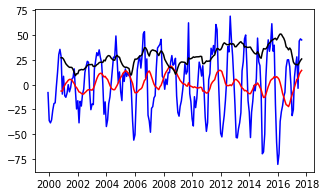

In [26]:
stationarity_test(DATA_ma_diff)

We know that EMA responds more quickly to the changing of production than the SMA. So we will calculate it.

### Exponential Moving Average

Text(0, 0.5, 'production')

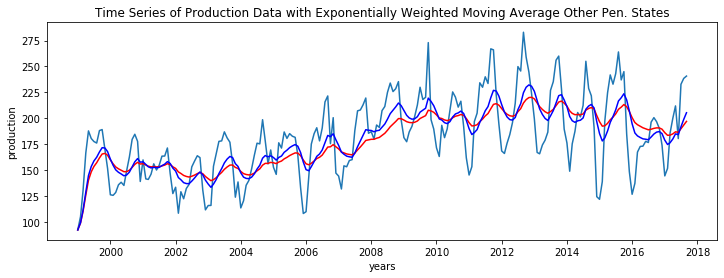

In [28]:
matplotlib.rcParams['figure.figsize'] = 12, 4
DATA_moving_exp_26 = DATA_start.ewm(span=26).mean()
DATA_moving_exp_12 = DATA_start.ewm(span=12).mean()
plt.plot(DATA_start)
plt.plot(DATA_moving_exp_26, color='red') # 26
plt.plot(DATA_moving_exp_12, color='blue') # 12
plt.title("Time Series of Production Data with Exponentially Weighted Moving Average " + region[1])
plt.xlabel("years")
plt.ylabel("production")

#### Shocks of exponentially weighted moving average

Text(0, 0.5, 'difference')

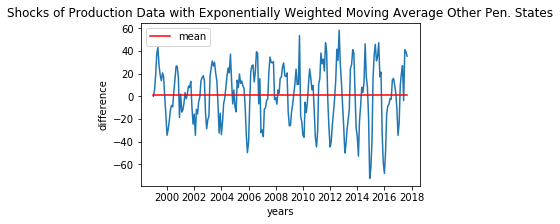

In [29]:
matplotlib.rcParams['figure.figsize'] = 5, 3
DATA_exp_diff = DATA_start.values - DATA_moving_exp_12.values
DATA_exp_diff = pd.Series(DATA_exp_diff, index=DATA_start.index).dropna()
plt.plot(DATA_exp_diff)

sts_avg = np.full(shape=len(DATA_exp_diff), fill_value=np.nanmean(DATA_ma_diff), dtype='float')
plt.plot(DATA_start.index, sts_avg, 'r', label="mean")
plt.legend()

plt.title("Shocks of Production Data with Exponentially Weighted Moving Average " + region[1])
plt.xlabel("years")
plt.ylabel("difference")

Test Statistic                  -5.155437
p-value                          0.000011
#Lags Used                      12.000000
Number of Observations Used    212.000000
Critical Value (1%)             -3.461578
Critical Value (5%)             -2.875272
Critical Value (10%)            -2.574089
dtype: float64


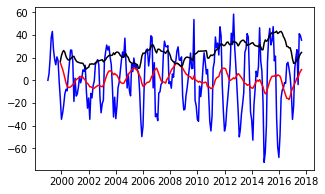

In [30]:
stationarity_test(DATA_exp_diff)

#### Shocks analysis:
Shocks shows us, that really exponential moving average finds more quickly changings in the data that we analyse.\
We can see more precisely the tendency of the data from differences between the original series and exponencial moving averages over the data. That is because EMA places a greater weight and significance on the most recent data points.

Text(0, 0.5, 'difference')

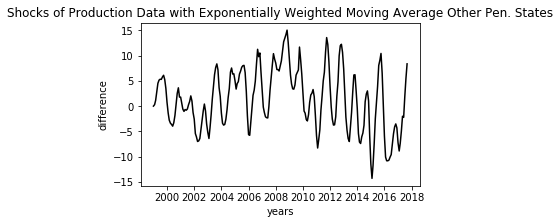

In [47]:
MACD = DATA_moving_exp_12.values - DATA_moving_exp_26.values
plt.plot(DATA_start.index, MACD, 'k')
plt.title("Shocks of Production Data with Exponentially Weighted Moving Average " + region[1])
plt.xlabel("years")
plt.ylabel("difference")

#### Plot analysis:
On the plot above, we can see difference, between the data smoothed with a window of 12 and 26 days, this kind of data searched in aim to know the trend-following momuntum indicator. The value we found called Moving Average Convergence Divergence, and we know that the point where the function crosses the OX axis is significant for us.\
What we need to know from these plots, that: the demand on the market increases when the difference is more than zero, and decreases when the difference is less than zero.

#### Moving Average and Exponencial Moving Average:
Exponencial moving average shows better results for Dickey-Fuller Test, as the recent data is acctually more stationary in our dataset. Inspite of this good fit of EMA, SMA also makes the data to become stationary.

## 6. Data Division

In [48]:
def split_data(data):
    test = data[(data.index.year.isin([2016, 2017]))]
    val = data[(data.index.year.isin([2014, 2015]))]
    train = data[~(data.index.year.isin([2014, 2015, 2016, 2017]))]
    return test, val, train

### 1. Additive Decomposition Analysis

Test Statistic                -7.708226e+00
p-value                        1.284468e-11
#Lags Used                     1.400000e+01
Number of Observations Used    1.900000e+02
Critical Value (1%)           -3.465244e+00
Critical Value (5%)           -2.876875e+00
Critical Value (10%)          -2.574945e+00
dtype: float64


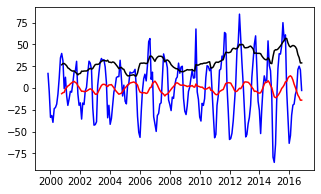

In [49]:
stationarity_test(estimated_residual_add)

In [50]:
test_add, val_add, train_add = split_data(estimated_residual_add)

### 2. Differencing Analysis

Text(0, 0.5, 'difference')

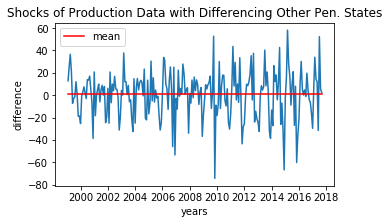

In [51]:
matplotlib.rcParams['figure.figsize'] = 5, 3
DATA_diff = DATA_start.values - DATA_start.shift(1).values
DATA_diff = pd.Series(DATA_diff, index=DATA_start.index).dropna()
plt.plot(DATA_diff)

sts_avg = np.full(shape=len(DATA_diff), fill_value=np.nanmean(DATA_diff), dtype='float')
plt.plot(DATA_diff.index, sts_avg, 'r', label="mean")
plt.legend()

plt.title("Shocks of Production Data with Differencing " + region[1])
plt.xlabel("years")
plt.ylabel("difference")

Test Statistic                -5.799513e+00
p-value                        4.666495e-07
#Lags Used                     1.400000e+01
Number of Observations Used    2.090000e+02
Critical Value (1%)           -3.462032e+00
Critical Value (5%)           -2.875471e+00
Critical Value (10%)          -2.574195e+00
dtype: float64


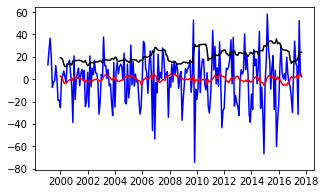

In [52]:
stationarity_test(DATA_diff)

In [53]:
test_diff, val_diff, train_diff = split_data(DATA_diff)

### 3. Log Additive Decomposition Analysis

In [54]:
DATA_log = np.log(DATA_start.values)

ss_decomposition_l_add = seasonal_decompose(x=DATA_log, model='additive', period=20)
estimated_trend_l_add = ss_decomposition_l_add.trend
estimated_seasonal_l_add = ss_decomposition_l_add.seasonal
estimated_residual_l_add = ss_decomposition_l_add.resid

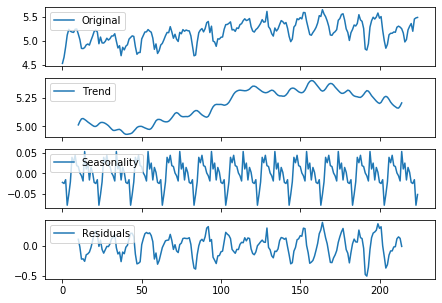

In [55]:
fig, axes = plt.subplots(4, 1, sharex=True, sharey=False)
fig.set_figheight(5)
fig.set_figwidth(7)

axes[0].plot(DATA_log, label='Original')
axes[0].legend(loc='upper left');

axes[1].plot(estimated_trend_l_add, label='Trend')
axes[1].legend(loc='upper left');

axes[2].plot(estimated_seasonal_l_add, label='Seasonality')
axes[2].legend(loc='upper left');

axes[3].plot(estimated_residual_l_add, label='Residuals')
axes[3].legend(loc='upper left');

In [56]:
estimated_residual_log_add = pd.Series(estimated_residual_l_add, index=DATA_start.index).dropna()

Test Statistic                -7.423319e+00
p-value                        6.647942e-11
#Lags Used                     1.400000e+01
Number of Observations Used    1.900000e+02
Critical Value (1%)           -3.465244e+00
Critical Value (5%)           -2.876875e+00
Critical Value (10%)          -2.574945e+00
dtype: float64


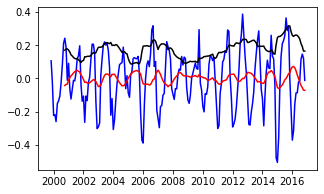

In [57]:
stationarity_test(estimated_residual_log_add)

In [58]:
test_log_add, val_log_add, train_log_add = split_data(estimated_residual_log_add)

### 4. Log Differencing Analysis

Text(0, 0.5, 'difference')

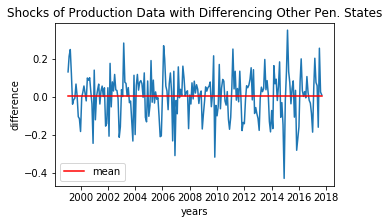

In [59]:
matplotlib.rcParams['figure.figsize'] = 5, 3

DATA_log = np.log(DATA_start)

DATA_diff_log = DATA_log.values - DATA_log.shift(1).values
DATA_diff_log = pd.Series(DATA_diff_log, index=DATA_log.index).dropna()
plt.plot(DATA_diff_log)

sts_avg = np.full(shape=len(DATA_diff_log), fill_value=np.nanmean(DATA_diff_log), dtype='float')
plt.plot(DATA_diff_log.index, sts_avg, 'r', label="mean")
plt.legend()

plt.title("Shocks of Production Data with Differencing " + region[1])
plt.xlabel("years")
plt.ylabel("difference")

Test Statistic                -5.996106e+00
p-value                        1.700138e-07
#Lags Used                     1.400000e+01
Number of Observations Used    2.090000e+02
Critical Value (1%)           -3.462032e+00
Critical Value (5%)           -2.875471e+00
Critical Value (10%)          -2.574195e+00
dtype: float64


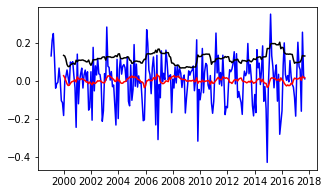

In [60]:
stationarity_test(DATA_diff_log)

In [61]:
test_diff_log, val_diff_log, train_diff_log = split_data(DATA_diff_log)

### 5. Multiplicative Decomposition Analysis

Test Statistic                -7.406940e+00
p-value                        7.302812e-11
#Lags Used                     1.400000e+01
Number of Observations Used    1.900000e+02
Critical Value (1%)           -3.465244e+00
Critical Value (5%)           -2.876875e+00
Critical Value (10%)          -2.574945e+00
dtype: float64


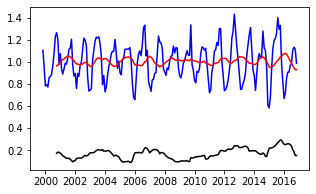

In [62]:
stationarity_test(estimated_residual_mul)
test_mul, val_mul, train_mul = split_data(estimated_residual_mul)

### 6. Multiplicative Decomposition Differenced Analysis

Test Statistic                -6.767990e+00
p-value                        2.686475e-09
#Lags Used                     1.500000e+01
Number of Observations Used    1.880000e+02
Critical Value (1%)           -3.465620e+00
Critical Value (5%)           -2.877040e+00
Critical Value (10%)          -2.575032e+00
dtype: float64


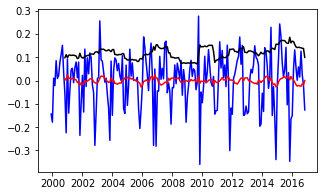

In [63]:
estimated_residual_mul_diff = estimated_residual_mul.diff().dropna()
stationarity_test(estimated_residual_mul_diff)
test_mul_diff, val_mul_diff, train_mul_diff = split_data(estimated_residual_mul_diff)

## 7. Training and Validation

### 1.1 Moving Average of Additive Decomposition

In [383]:
rolling_add = train_add.rolling(30, center=True).mean().values

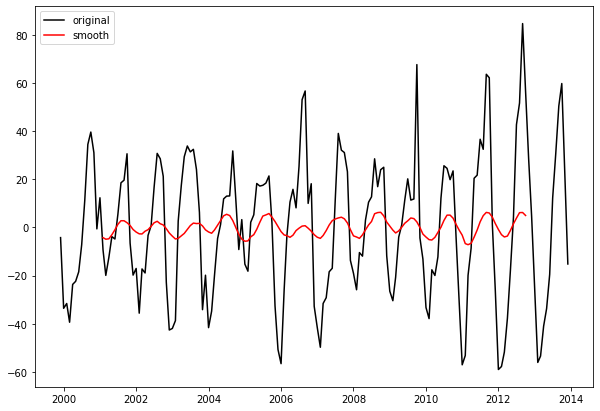

In [384]:
matplotlib.rcParams['figure.figsize'] = 10, 7
plt.plot(train_add.index[1:], train_add.values[1:], 'k', label="original")
plt.plot(train_add.index, np.insert(rolling_add,0,0)[1:], 'r', label="smooth")
plt.legend()

In [385]:
def moving_average(observations, window=3, forecast=False):
    '''returns the smoothed version of an array of observations.'''
    cumulative_sum = np.cumsum(observations, dtype=float)
    cumulative_sum[window:] = cumulative_sum[window:] - cumulative_sum[:-window]
    if forecast:
        return np.insert(cumulative_sum[window - 1:] / window, 0, np.zeros(3))
    else:
        return cumulative_sum[window - 1:] / window

In [378]:
smoothed_add = moving_average(train_add.values, window=3, forecast=True)

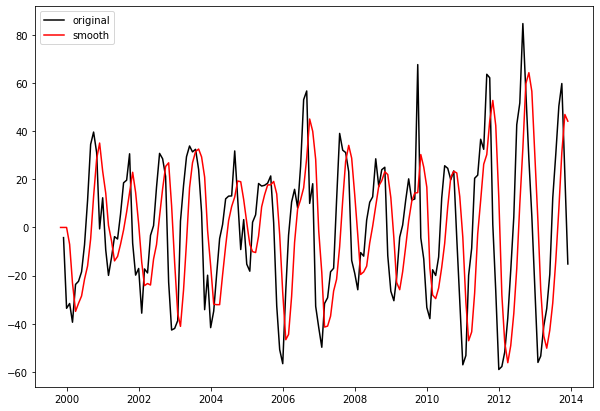

In [380]:
matplotlib.rcParams['figure.figsize'] = 10, 7
plt.plot(train_add.index[1:], train_add.values[1:], 'k', label="original")
plt.plot(train_add.index, smoothed_add[:-1], 'r', label="smooth")
plt.legend()

### 1.2 Exponencial Average of Additive Decomposition

In [376]:
def ewma(observations, forecast=True):
    '''returns the exponentially weighted smoothed version of an array of observations.'''
    weights = np.array([0.160, 0.294, 0.543])
    output = np.zeros_like(observations, dtype='float')
    for i, _ in enumerate(observations):
        if (i == 0) or (i == 1) or (i == len(observations) - 1):
            pass
        else:
            output[i] = np.dot(observations[i-2:i+1], weights)
    if forecast:
        return np.insert(output, 0, 0)
    else:
        return output

In [387]:
ewma_smoothed_vals = ewma(train_add.values, forecast=True)

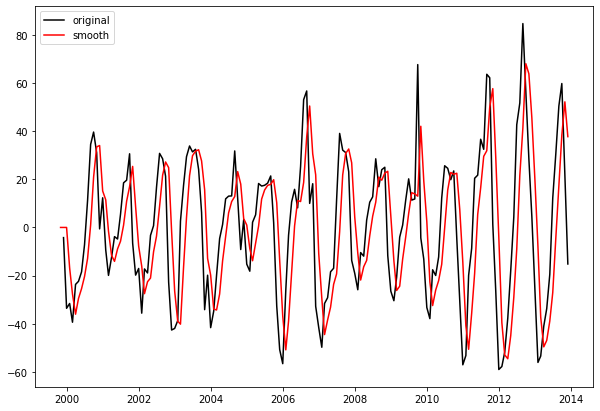

In [388]:
matplotlib.rcParams['figure.figsize'] = 10, 7
plt.plot(train_add.index[1:], train_add.values[1:], 'k', label="original")
plt.plot(train_add.index, ewma_smoothed_vals[:-1], 'r', label="smooth")
plt.legend()

#### Simple prediction on MA and EA

In [394]:
simple_avg_preds = np.full(shape=len(val_add), fill_value=np.mean(estimated_residual_add), dtype='float')

# mse
simple_mse = mean_squared_error(val_add, simple_avg_preds)

# results
print("Predictions: ", simple_avg_preds)
print("MSE: ", simple_mse)

Predictions:  [-0.33156598 -0.33156598 -0.33156598 -0.33156598 -0.33156598 -0.33156598
 -0.33156598 -0.33156598 -0.33156598 -0.33156598 -0.33156598 -0.33156598
 -0.33156598 -0.33156598 -0.33156598 -0.33156598 -0.33156598 -0.33156598
 -0.33156598 -0.33156598 -0.33156598 -0.33156598 -0.33156598 -0.33156598]
MSE:  1908.7520096427513


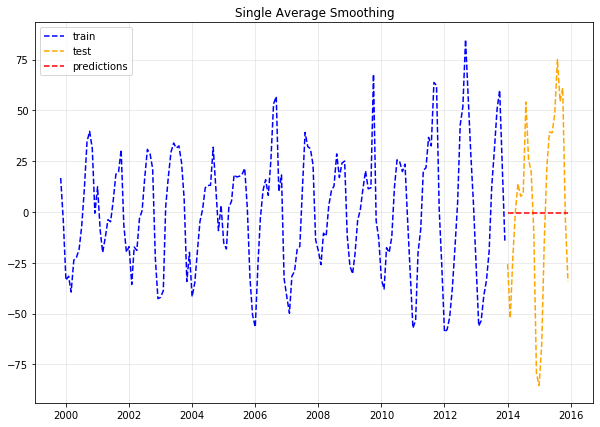

In [395]:
plt.plot(train_add, 'b--', label="train")
plt.plot(val_add, color='orange', linestyle="--", label="test")
plt.plot(val_add.index, simple_avg_preds, 'r--', label="predictions")
plt.legend(loc='upper left')
plt.title("Single Average Smoothing")
plt.grid(alpha=0.3);

#### Single Exponential

In [398]:
single = SimpleExpSmoothing(train_add).fit(optimized=True)
single_preds = single.forecast(len(val_add))
single_mse = mean_squared_error(val_add, single_preds)
# print("Predictions: ", single_preds)
print("MSE: ", single_mse)

MSE:  2232.982655424094


/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



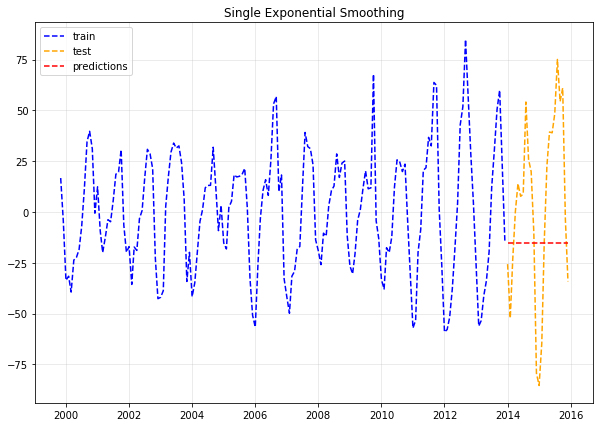

In [399]:
plt.plot(train_add, 'b--', label="train")
plt.plot(val_add, color='orange', linestyle="--", label="test")
plt.plot(val_add.index, single_preds, 'r--', label="predictions")
plt.legend(loc='upper left')
plt.title("Single Exponential Smoothing")
plt.grid(alpha=0.3);

#### Double Exponential

In [400]:
double = Holt(train_add).fit(optimized=True)
double_preds = double.forecast(len(val_add))
double_mse = mean_squared_error(val_add, double_preds)
# print("Predictions: ", double_preds)
print("MSE: ", double_mse)

MSE:  2232.982655424094


/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



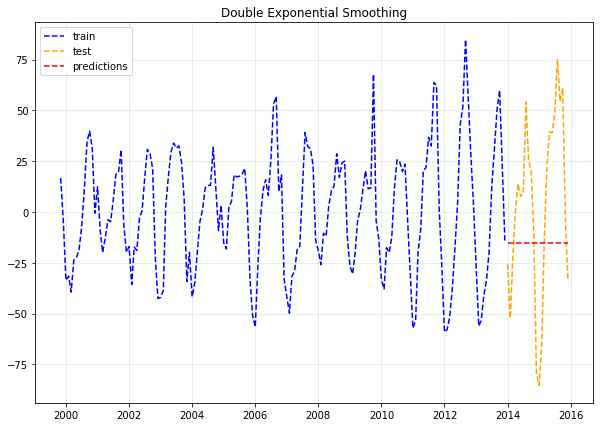

In [402]:
plt.plot(train_add, 'b--', label="train")
plt.plot(val_add, color='orange', linestyle="--", label="test")
plt.plot(val_add.index, double_preds, 'r--', label="predictions")
plt.legend(loc='upper left')
plt.title("Double Exponential Smoothing")
plt.grid(alpha=0.3);

#### Triple Exponential

In [417]:
triple = ExponentialSmoothing(train_add,
                              trend="add",
                              seasonal="add",
                              seasonal_periods=13
                             ).fit(optimized=True)
triple_preds = triple.forecast(len(val_add))
triple_mse = mean_squared_error(val_add, triple_preds)
# print("Predictions: ", triple_preds)
print("MSE: ", triple_mse)

MSE:  4787.597706413341


/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/holtwinters.py:744: ConvergenceWarning:

Optimization failed to converge. Check mle_retvals.



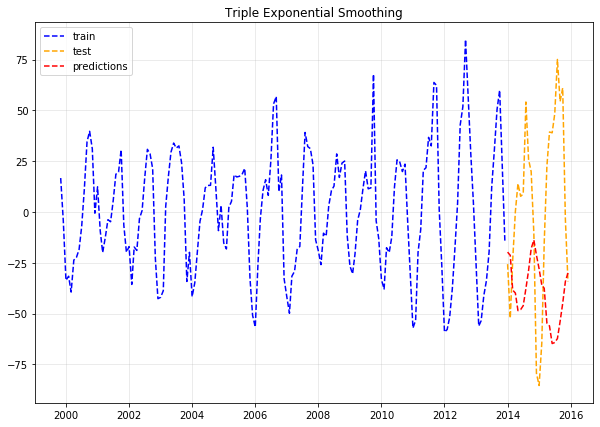

In [418]:
plt.plot(train_add, 'b--', label="train")
plt.plot(val_add, color='orange', linestyle="--", label="test")
plt.plot(val_add.index, triple_preds, 'r--', label="predictions")
plt.legend(loc='upper left')
plt.title("Triple Exponential Smoothing")
plt.grid(alpha=0.3);

### AR, MA, ARMA, ARIMA
### 1.3.1 AR, MA, ARMA, ARIMA of Additive Decomposition

#### ACF and PCF Tests of Additive Decomposition

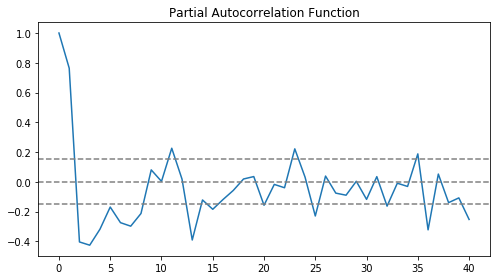

In [93]:
def pacf_plot(data, pacf_array):
    matplotlib.rcParams['figure.figsize'] = 7, 4
    #Plot PACF:
    plt.plot(pacf_array)
    plt.axhline(y=0,linestyle='--',color='gray')
    plt.axhline(y=-1.96/np.sqrt(len(data)),linestyle='--',color='gray')
    plt.axhline(y=1.96/np.sqrt(len(data)),linestyle='--',color='gray')
    plt.title('Partial Autocorrelation Function')
    plt.tight_layout()
    
add_pacf = pacf(train_add, nlags=40, method='ols')
pacf_plot(train_add, add_pacf)
add_pacf_val = 5

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:572: FutureWarning:

fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.



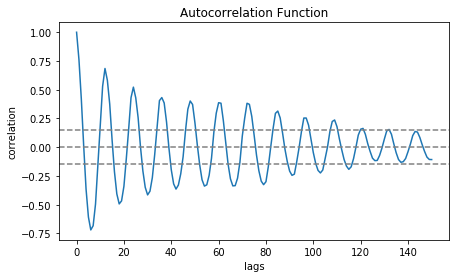

In [94]:
def acf_plot(data, acf_array):
    matplotlib.rcParams['figure.figsize'] = 7, 4
    #Plot ACF: 
    plt.plot(acf_array)
    plt.axhline(y=0,linestyle='--',color='gray')
    plt.axhline(y=-1.96/np.sqrt(len(data)),linestyle='--',color='gray')
    plt.axhline(y=1.96/np.sqrt(len(data)),linestyle='--',color='gray')
    plt.title('Autocorrelation Function')
    plt.xlabel('lags')
    plt.ylabel('correlation')

add_acf = acf(train_add, nlags=150)
acf_plot(train_add, add_acf)
add_acf_val = 19

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:572: FutureWarning:

fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.



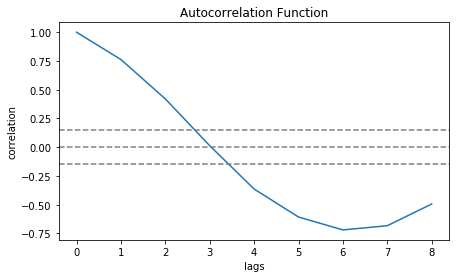

In [95]:
add_acf = acf(train_add, nlags=8)
acf_plot(train_add, add_acf)
add_acf_val_presice = 3

In [96]:
def optimize_ARIMA(order_list, data):
    results = []
    
    for order in order_list:
        try: 
            model = ARIMA(data, order=order).fit(disp=-1)
        except:
            continue
        
        aic = model.aic
        results.append([order, model.aic])
        
    result_df = pd.DataFrame(results)
    result_df.columns = ['(p, d, q)', 'AIC']
    #Sort in ascending order, lower AIC is better
    result_df = result_df.sort_values(by='AIC', ascending=True).reset_index(drop=True)
    
    return result_df

In [948]:
# check AR
order_list = [
    (1, 0, 0), 
    (3, 0, 0),
    (5, 0, 0),
    (12, 0, 0),
    (19, 0, 0),
    (20, 0, 0)
]

train_add.index = pd.DatetimeIndex(train_add.index.values,
                               freq=train_add.index.inferred_freq)
optimize_ARIMA(order_list, train_add)

,"(p, d, q)",AIC
0,"(19, 0, 0)",1361.812422
1,"(12, 0, 0)",1382.627606
2,"(5, 0, 0)",1412.297700
3,"(3, 0, 0)",1430.309098
4,"(1, 0, 0)",1488.564209


In [70]:
add_aic_pacf_val = 20

In [71]:
DEC = 'Decomposed'
DIFF = 'Diff'
LOG_DEC = 'Log Decomposed'
LOG_DEC_DIFF = 'Log Decomposed Diff'


dict_models = {
    'AR': 0,
    'MA': 0,
    'ARMA': 0,
    'ARIMA': 0
}

dict_data = {
    DEC: deepcopy(dict_models),
    DIFF: deepcopy(dict_models),
    LOG_DEC: deepcopy(dict_models),
    LOG_DEC_DIFF: deepcopy(dict_models),
}

TRAIN = 'train'
VALID = 'valid'
TEST = 'test'

dict_RMSE = {TRAIN: deepcopy(dict_data), VALID: deepcopy(dict_data), TEST: deepcopy(dict_data)}

### AR Model of Additive Decomposition
PACF defines p value for AR model - the number of lag observations included in the model, also called the lag order.

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


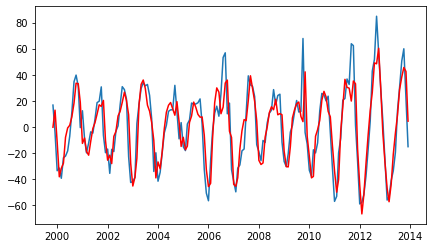

RMSE:  192.65281671911177


In [72]:
def AR_model(data, p, data_type):
    '''
    data_type: DEC or DIFF or ...
    '''
    model = ARIMA(data, order=(p, 0, 0))
    results_AR = model.fit(disp=-1)
    plt.plot(data)
    plt.plot(results_AR.fittedvalues, color='red')
    plt.show()
    rmse = np.sqrt(sum((results_AR.fittedvalues.values-data.values)**2))
    print('RMSE: ', rmse)
    dict_RMSE[TRAIN][data_type]['AR'] = rmse
    return results_AR
    
# add_pacf_val = 7
results_AR_add = AR_model(train_add, add_pacf_val, DEC)
# add_pacf_val = 20
# results_AR_add = AR_model(train_add, add_aic_pacf_val, DEC)

### AR Validate Model Forecast of Additive Decomposition

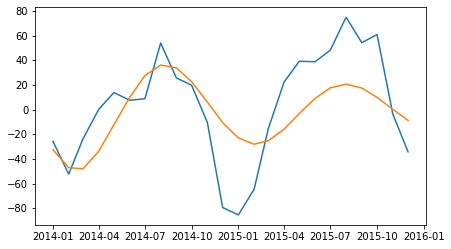

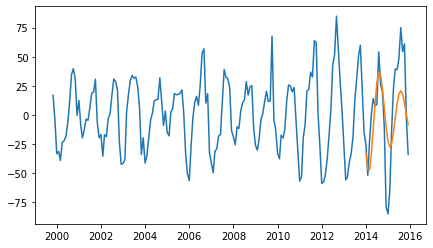

RMSE:  7.860079530217604e+31


In [88]:
def data_validation(model_results, val_data, train_data, data_type, model_type):
    ff = model_results.predict(start=val_data.index[0], end=val_data.index[-1])
    ff = pd.DataFrame(ff,index = val_data.index)
    plt.plot(pd.concat([val_data,ff],axis=1))
    plt.show()
    train_val_df = pd.concat([train_data.append(val_data),ff],axis=1)
    plt.plot(train_val_df)
    plt.show()
    RMSE = np.sqrt(mean_squared_error(np.exp(ff), np.exp(val_data)))
    dict_RMSE[VALID][data_type][model_type] = RMSE
    print('RMSE: ', RMSE)
    
data_validation(results_AR_add, val_add, train_add, DEC, 'AR')

### MA Model of Additive Decomposition
ACF defines `q` value for MA model - the size of the moving average window, also called the order of moving average.

In [956]:
# check AR
order_list = [
    (0, 0, 3), 
    (0, 0, 7),
    (0, 0, 12),
    (0, 0, 23),
]

train_add.index = pd.DatetimeIndex(train_add.index.values,
                               freq=train_add.index.inferred_freq)
optimize_ARIMA(order_list, train_add)

,"(p, d, q)",AIC
0,"(0, 0, 12)",1397.088192
1,"(0, 0, 7)",1422.679938
2,"(0, 0, 3)",1458.003343


In [1173]:
add_aic_acf_val_ma = 12

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


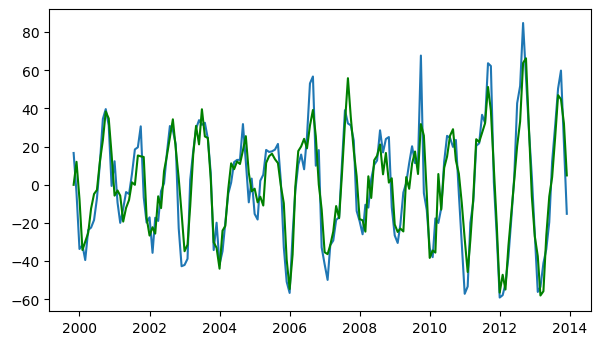

RMSE:  156.71818999031674


In [1458]:
def MA_model(data, q, data_type):
    model = ARIMA(data, order=(0, 0, q))  
    results_MA = model.fit(disp=-1)  
    plt.plot(data)
    plt.plot(results_MA.fittedvalues, color='green')
    plt.show()
    rmse = np.sqrt(sum((results_MA.fittedvalues.values-data.values)**2))
    print('RMSE: ', rmse)
    dict_RMSE[TRAIN][data_type]['MA'] = rmse
    return results_MA
    
results_MA_add = MA_model(train_add, 23, DEC)

### MA Validate Model Forecast of Additive Decomposition

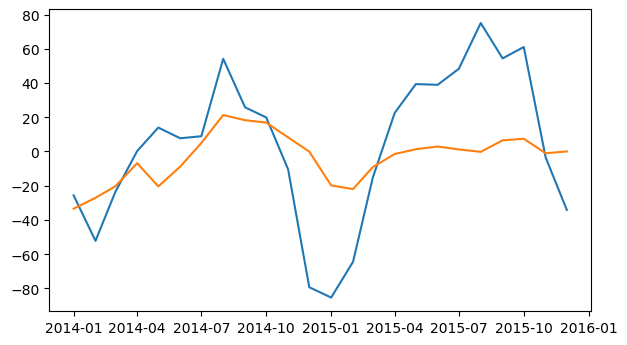

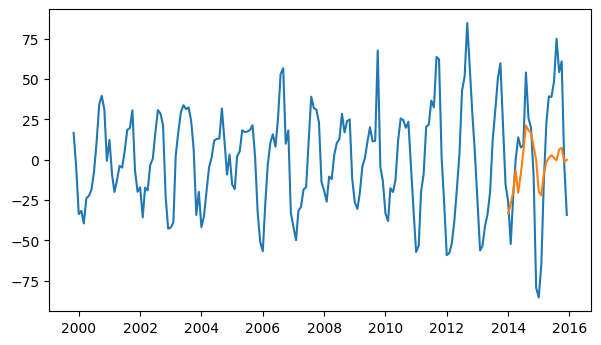

RMSE:  7.860079530217604e+31


In [1459]:
data_validation(results_MA_add, val_add, train_add, DEC, 'MA')

### ARMA Model of Additive Decomposition

In [965]:
# check AR
order_list = [
    (3, 0, 3), 
    (3, 0, 7),
    (7, 0, 3),
    (7, 0, 1),
]

train_add.index = pd.DatetimeIndex(train_add.index.values,
                               freq=train_add.index.inferred_freq)
optimize_ARIMA(order_list, train_add)

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


,"(p, d, q)",AIC
0,"(7, 0, 3)",1359.974633
1,"(3, 0, 7)",1372.618597
2,"(3, 0, 3)",1383.474288
3,"(7, 0, 1)",1387.043296


From here we can see that for `ARMA` we can use `add_acf_val_presice` and `add_pacf_val`

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


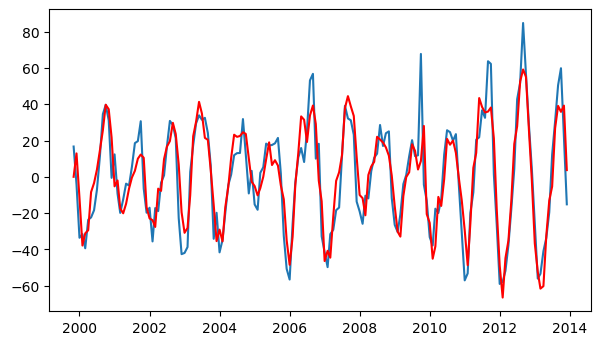

RMSE:  170.6550329824684


In [1460]:
def ARMA_model(data, p, q, data_type):
    model = ARIMA(data, order=(p, 0, q))
    results_ARMA = model.fit(disp=-1)
    plt.plot(data)
    plt.plot(results_ARMA.fittedvalues, color='red')
    plt.show()
    rmse = np.sqrt(sum((results_ARMA.fittedvalues.values-data.values)**2))
    print('RMSE: ', rmse)
    dict_RMSE[TRAIN][data_type]['ARMA'] = rmse
    return results_ARMA

results_ARMA_add = ARMA_model(train_add, add_pacf_val, add_acf_val_presice, DEC)

### ARMA Validate Model Forecast of Additive Decomposition

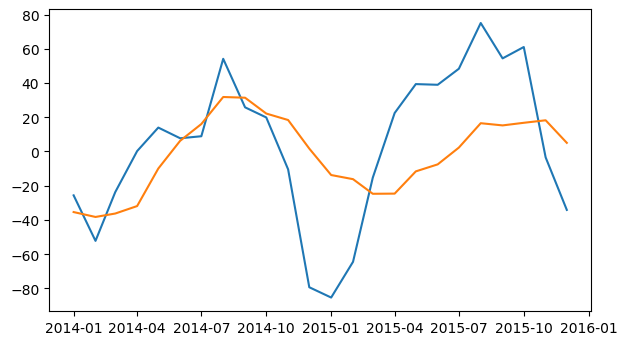

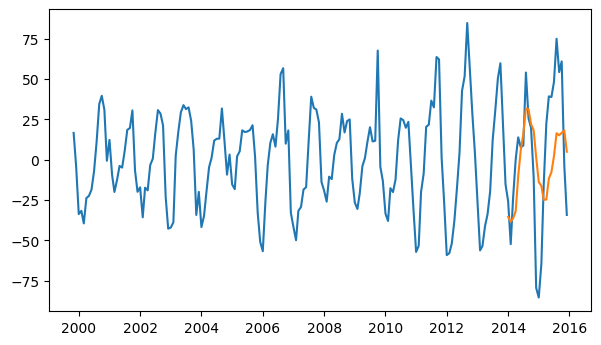

RMSE:  7.860079530217604e+31


In [1461]:
data_validation(results_ARMA_add, val_add, train_add, DEC, 'ARMA')

### ARIMA model of Additive Decomposition

In [980]:
# check ARIMA features
order_list = [
    (8, 1, 3),
    (7, 1, 1),
]

train_add.index = pd.DatetimeIndex(train_add.index.values,
                               freq=train_add.index.inferred_freq)
optimize_ARIMA(order_list, train_add)

,"(p, d, q)",AIC
0,"(8, 1, 3)",1386.828096
1,"(7, 1, 1)",1389.360124


/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


RMSE:  419.0860095325216


/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


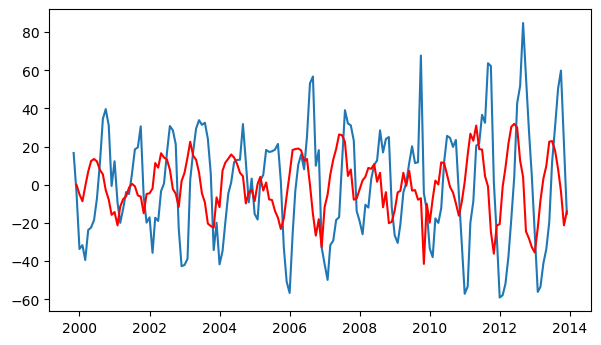

In [1462]:
def ARIMA_model(data, p, q, data_type):
    model = ARIMA(data, order=(p, 1, q))  
    results_AIRMA = model.fit(disp=-1)
    plt.plot(data)
    plt.plot(results_AIRMA.fittedvalues, color='red')
    rmse = np.sqrt(sum((results_AIRMA.fittedvalues.values-data.values[1:])**2))
    print('RMSE: ', rmse)
    dict_RMSE[TRAIN][data_type]['ARIMA'] = rmse
    return results_AIRMA
    
results_ARIMA_add = ARIMA_model(train_add, add_pacf_val + 1, add_acf_val_presice, DEC)

### ARMA Validate Model Forecast of Additive Decomposition

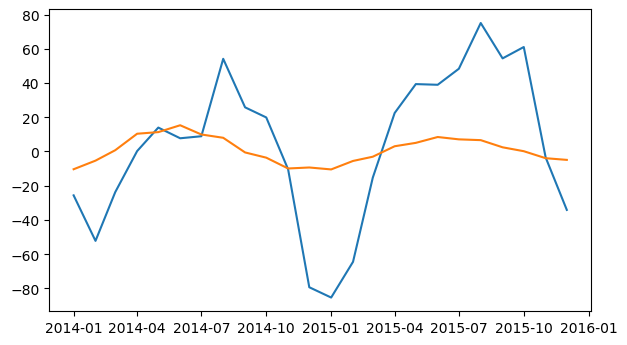

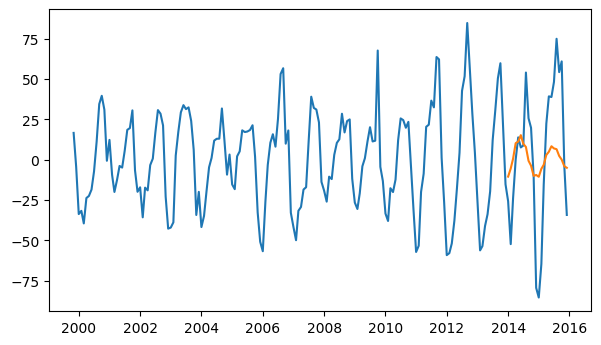

RMSE:  7.860079530217604e+31


In [1463]:
data_validation(results_ARIMA_add, val_add, train_add, DEC, 'ARIMA')

### 1.3.2 AR, MA, ARMA, ARIMA of Differenced

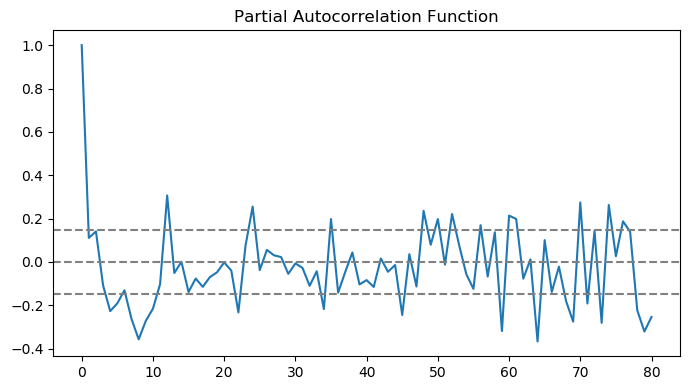

In [874]:
diff_pacf = pacf(train_diff, nlags=80, method='ols')
pacf_plot(train_diff, diff_pacf)

In [1212]:
diff_pacf_val = 4

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:572: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning


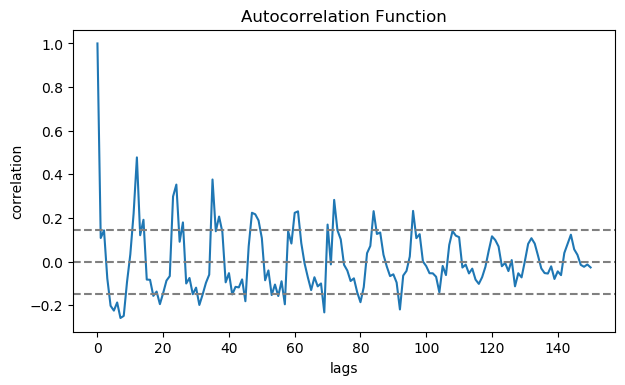

In [881]:
diff_acf = acf(train_diff, nlags=150)
acf_plot(train_diff, diff_acf)

In [982]:
diff_acf_val = 11

### AR Model of Differenced

In [984]:
# check AR
order_list = [
    (19, 0, 0),
    (11, 0, 0),
    (7, 0, 0),
    (4, 0, 0),
]

train_diff.index = pd.DatetimeIndex(train_diff.index.values,
                               freq=train_diff.index.inferred_freq)
optimize_ARIMA(order_list, train_diff)

,"(p, d, q)",AIC
0,"(19, 0, 0)",1504.480594
1,"(11, 0, 0)",1511.726967
2,"(7, 0, 0)",1550.019973
3,"(4, 0, 0)",1565.562449


In [1058]:
diff_aic_pacf_val = 19

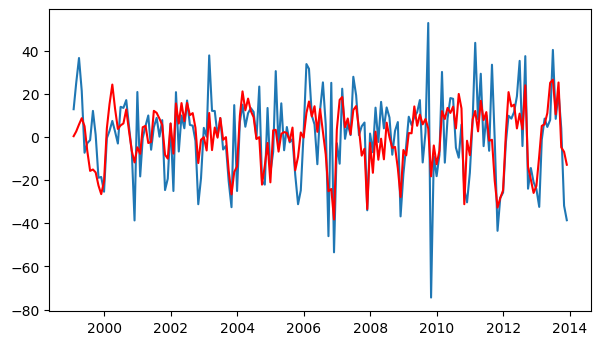

RMSE:  193.03254175199916


In [1464]:
results_AR_diff = AR_model(train_diff, diff_aic_pacf_val, DIFF)

### AR Validate Model Forecast of Differenced

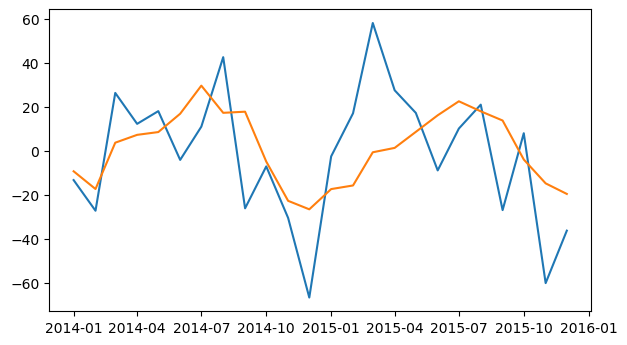

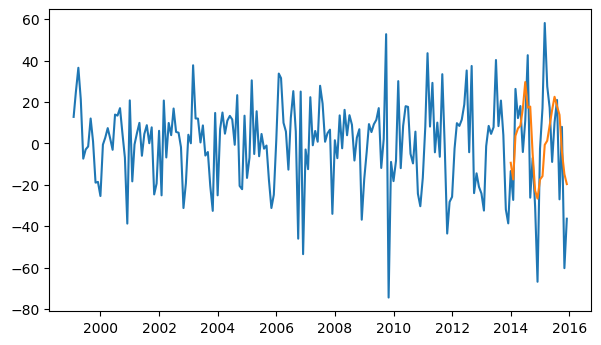

RMSE:  3.713336701840266e+24


In [1465]:
data_validation(results_AR_diff, val_diff, train_diff, DIFF, 'AR')

### MA Model of Differenced

In [ ]:
# check MA
order_list = [
    (0, 0, 3),
    (0, 0, 17),
]

optimize_ARIMA(order_list, train_diff)

In [1252]:
diff_aic_acf_val = 17

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


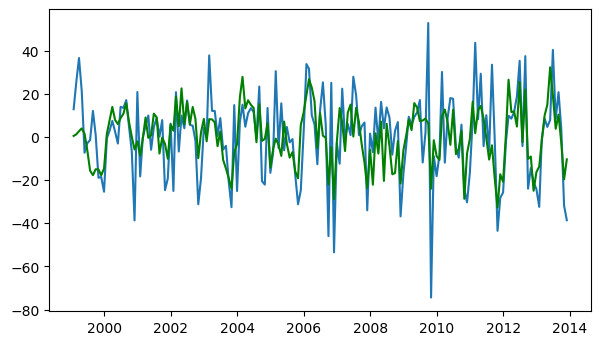

RMSE:  198.05112277035533


In [1466]:
results_MA_diff = MA_model(train_diff, diff_aic_acf_val, DIFF)

### MA Validate Model Forecast of Differenced

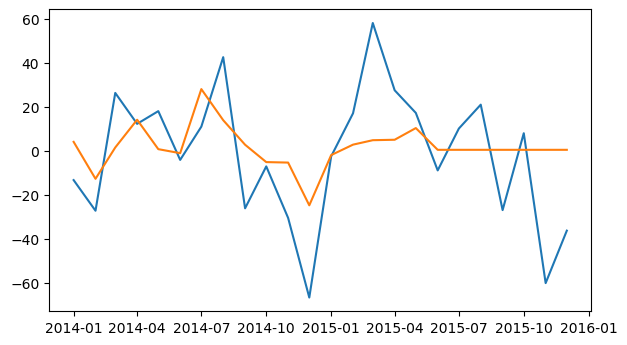

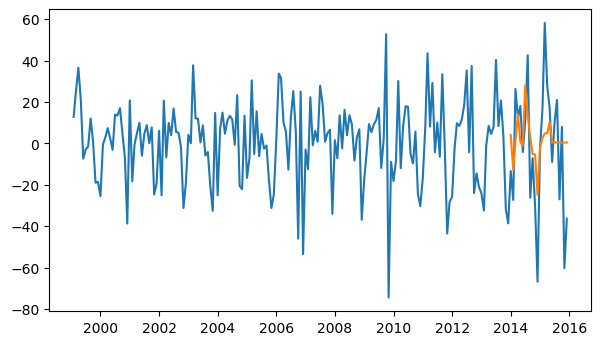

RMSE:  3.713336701840266e+24


In [1467]:
data_validation(results_MA_diff, val_diff, train_diff, DIFF, 'MA')

### ARMA Model of Differenced Data

In [1271]:
# check MA
order_list = [
    (7, 0, 3),
#     (3, 1, 0),
#     (0, 1, 3),
#     (0, 1, 7),
#     (5, 1, 13)
]

optimize_ARIMA(order_list, train_diff)

,"(p, d, q)",AIC
0,"(7, 0, 3)",1500.329578


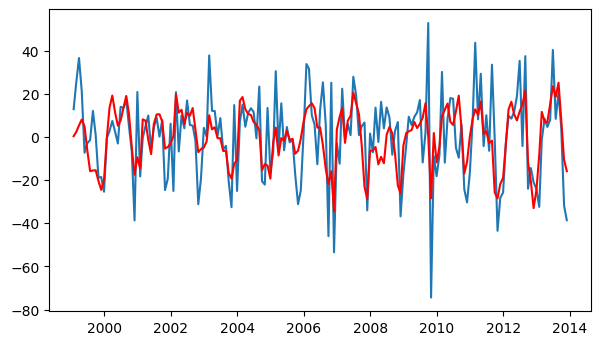

RMSE:  200.43250817121174


In [1468]:
results_ARMA_diff = ARMA_model(train_diff, 7, 3, DIFF)

### ARMA Validate Model Forecast of Differenced

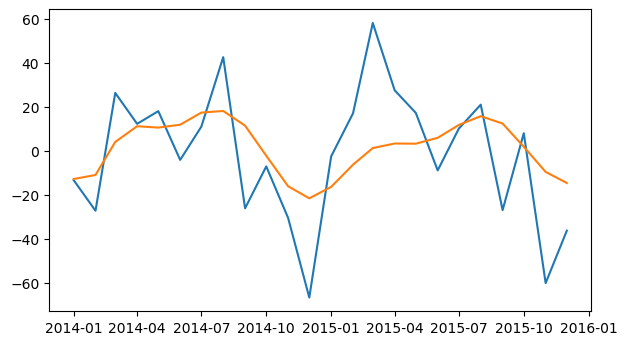

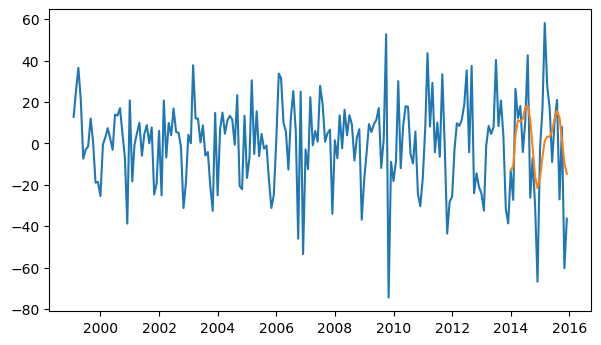

RMSE:  3.713336701840266e+24


In [1469]:
data_validation(results_ARMA_diff, val_diff, train_diff, DIFF, 'ARMA')

### ARIMA Model of Differenced Data

In [1279]:
# check ARIMA
order_list = [
    (3, 1, 0),
    (7, 1, 0),
#     (0, 1, 3),
#     (0, 1, 7),
#     (5, 1, 13)
]

optimize_ARIMA(order_list, train_diff)

,"(p, d, q)",AIC
0,"(7, 1, 0)",1606.787086
1,"(3, 1, 0)",1609.541112


RMSE:  353.67559789456755


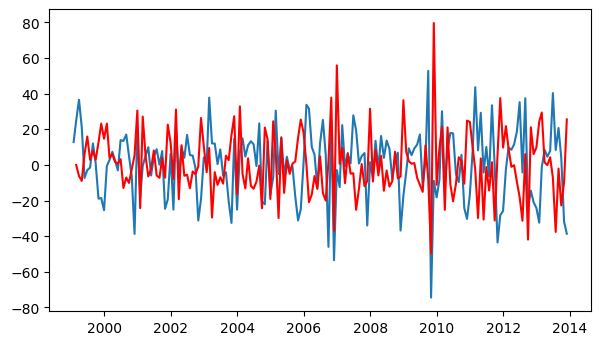

In [1470]:
results_ARIMA_diff = ARIMA_model(train_diff, 4, 1, DIFF)

### ARIMA Validate Model Forecast of Differenced

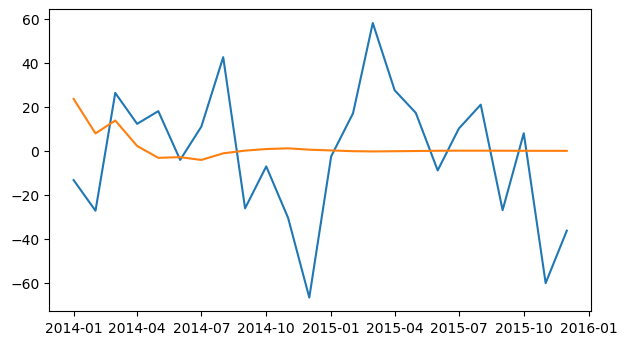

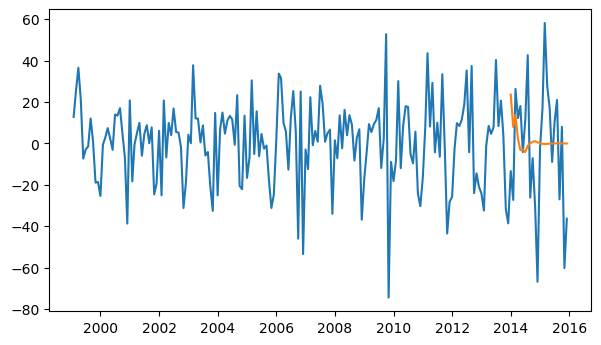

RMSE:  3.713336701840266e+24


In [1471]:
data_validation(results_ARIMA_diff, val_diff, train_diff, DIFF, 'ARIMA')

### 1.3.3 AR, MA, ARMA, ARIMA of Log Decomposed

In [104]:
log_acf = acf(train_log_add, nlags=150)
log_pacf = pacf(train_log_add, nlags=89, method='ols')

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:572: FutureWarning:

fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.



In [105]:
train_log_add

1999-11-01    0.105982
1999-12-01   -0.024737
2000-01-01   -0.223049
2000-02-01   -0.218381
2000-03-01   -0.259618
                ...   
2013-08-01    0.149839
2013-09-01    0.229724
2013-10-01    0.286430
2013-11-01    0.118526
2013-12-01   -0.065467
Length: 170, dtype: float64

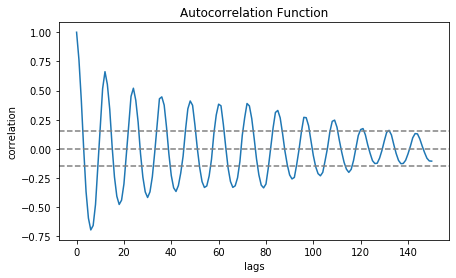

In [106]:
acf_plot(train_log_add, log_acf)
log_acf_val = 19

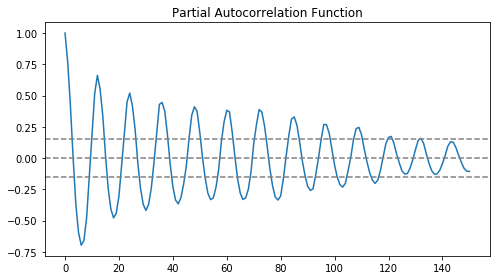

In [107]:
pacf_plot(train_log_add, log_acf)
log_pacf_val = 19

### AR model of Log Decomposed

In [86]:
results_AR_log = AR_model(train_log_add, log_pacf_val, LOG_DEC)

NameError: name 'log_pacf_val' is not defined

### AR Validate Model Forecast of Log Dcomposed

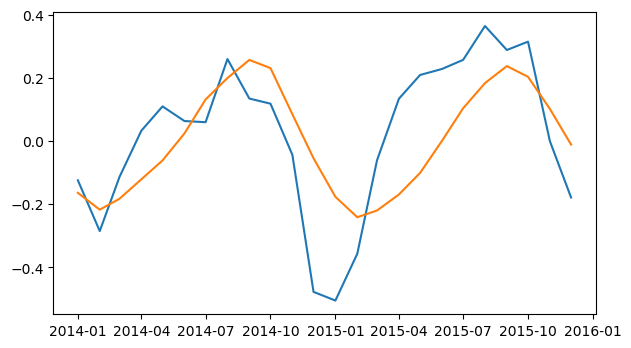

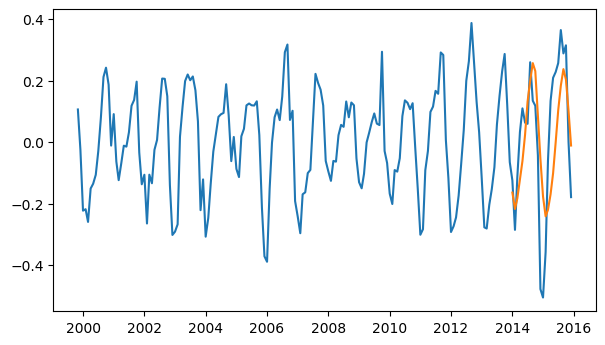

RMSE:  0.17479245961655207


In [1473]:
def log_validation(model_results, val_data, train_log_data, data_type, model_type):
    ff = model_results.predict(start=val_log_add.index[0], end=val_log_add.index[-1])
    ff = pd.DataFrame(ff,index = val_log_add.index)
    plt.plot(pd.concat([val_log_add,ff],axis=1))
    plt.show()
    train_val_df = pd.concat([train_log_data.append(val_data),ff],axis=1)
    plt.plot(train_val_df)
    plt.show()
    RMSE = np.sqrt(mean_squared_error(np.exp(ff), np.exp(val_data)))
    dict_RMSE[VALID][data_type][model_type] = RMSE
    print('RMSE: ', RMSE)
    
log_validation(results_AR_log, val_log_add, train_log_add, LOG_DEC, 'AR')

### MA model of Log Decomposed

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


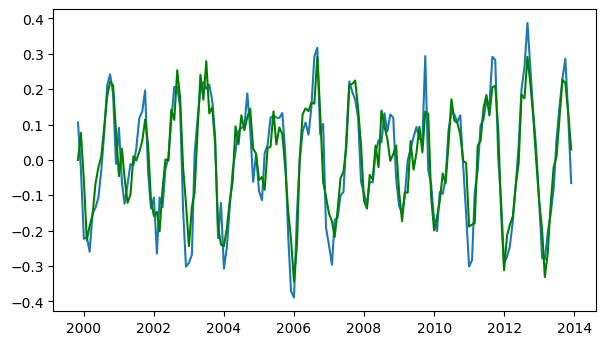

RMSE:  0.9013870030137918


In [1474]:
results_MA_log = MA_model(train_log_add, log_pacf_val + 1, LOG_DEC)

### MA Validate Model Forecast of Log Decomposed

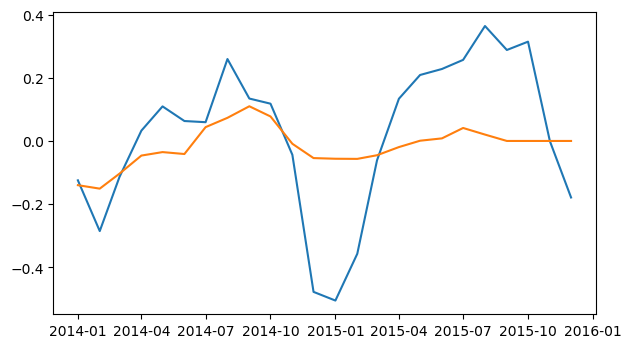

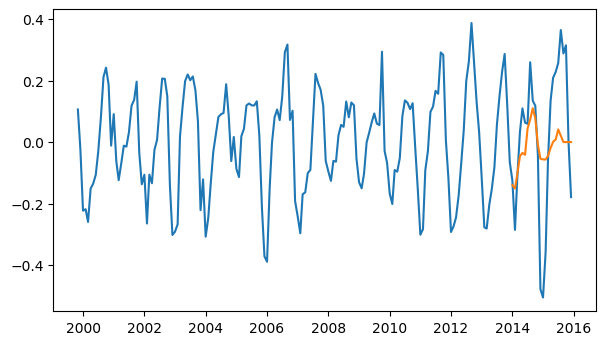

RMSE:  0.20857970142869017


In [1475]:
log_validation(results_MA_log, val_log_add, train_log_add, LOG_DEC, 'MA')

### ARMA model of Log Decomposed

In [1323]:
# check ARIMA
order_list = [
    (3, 0, 7),
    (3, 0, 19),
#     (0, 0, 20),
#     (0, 1, 7),
#     (5, 1, 13)
]

optimize_ARIMA(order_list, train_log_add)

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)
/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


,"(p, d, q)",AIC
0,"(3, 0, 7)",-390.010395


/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


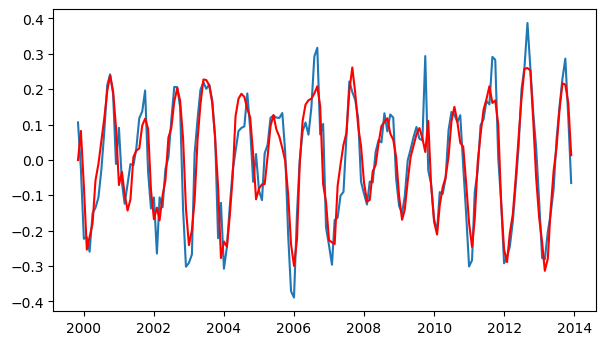

RMSE:  0.9376632323553484


In [1476]:
results_ARMA_log = ARMA_model(train_log_add, 3, 7, LOG_DEC)

### ARMA Validate Model Forecast of Log Decomposed

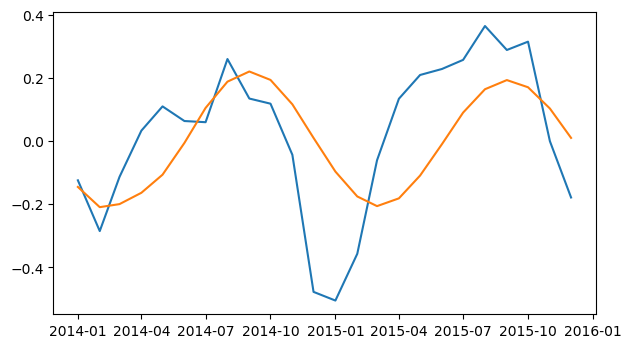

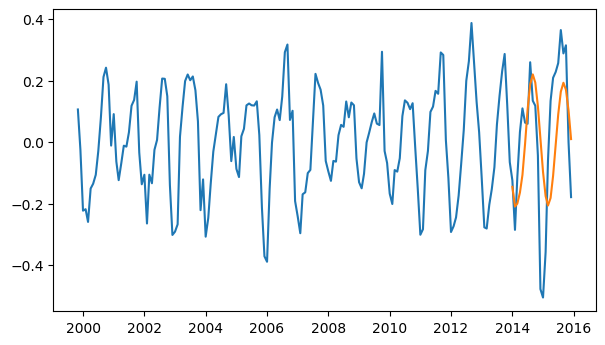

RMSE:  0.19473374518773634


In [1477]:
log_validation(results_ARMA_log, val_log_add, train_log_add, LOG_DEC, 'ARMA')

### ARIMA model of Log Decomposed

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


RMSE:  2.3373143319759144


/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  'available', HessianInversionWarning)


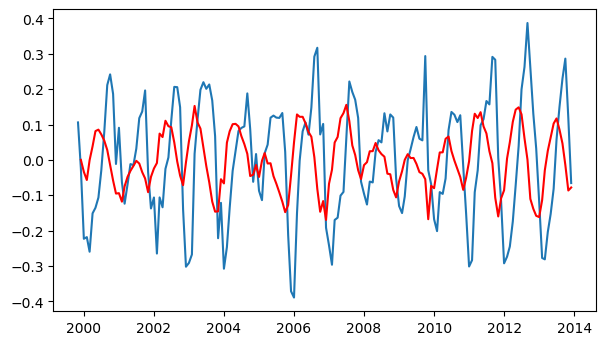

In [1478]:
results_ARIMA_log = ARIMA_model(train_log_add, 2, 3, LOG_DEC)

### ARIMA Validate Model Forecast of Log Decomposed

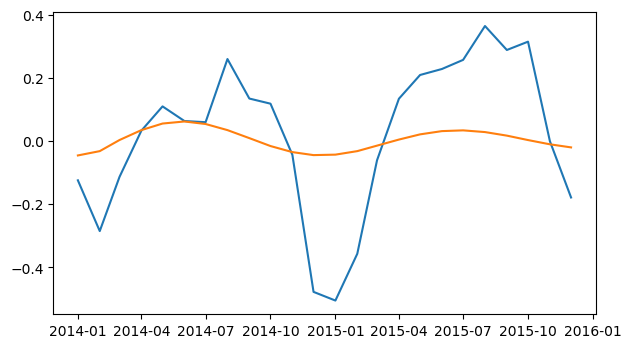

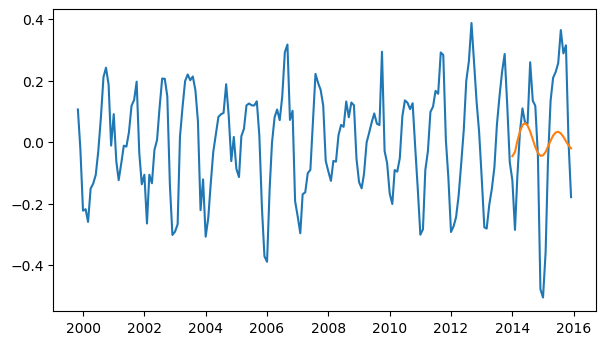

RMSE:  0.21342219711575483


In [1479]:
log_validation(results_ARIMA_log, val_log_add, train_log_add, LOG_DEC, 'ARIMA')

### 1.3.4 AR, MA, ARMA, ARIMA of Log Decomposed Differenced

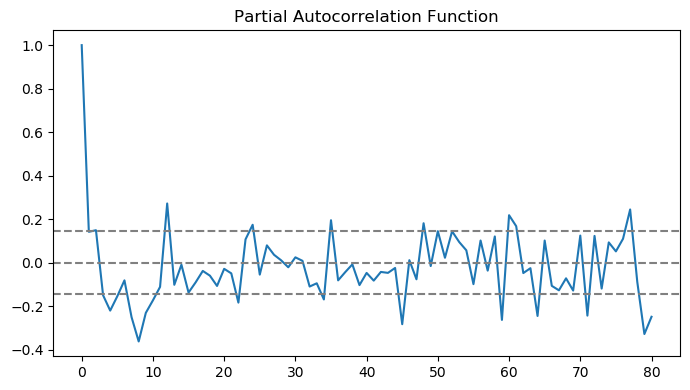

In [1344]:
diff_log_pacf = pacf(train_diff_log, nlags=80, method='ols')
pacf_plot(train_diff_log, diff_log_pacf)

In [1348]:
diff_log_pacf_val = 2

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/stattools.py:572: FutureWarning: fft=True will become the default in a future version of statsmodels. To suppress this warning, explicitly set fft=False.
  FutureWarning


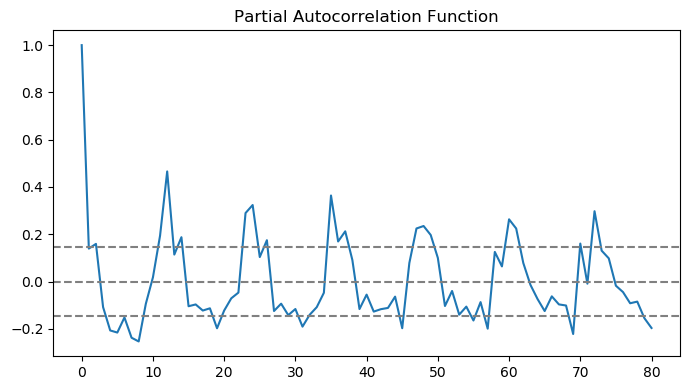

In [1346]:
diff_log_acf = acf(train_diff_log, nlags=80)
pacf_plot(train_diff_log, diff_log_acf)

In [1347]:
diff_log_acf_val = 5

### AR model of Log Decomposed Differenced

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


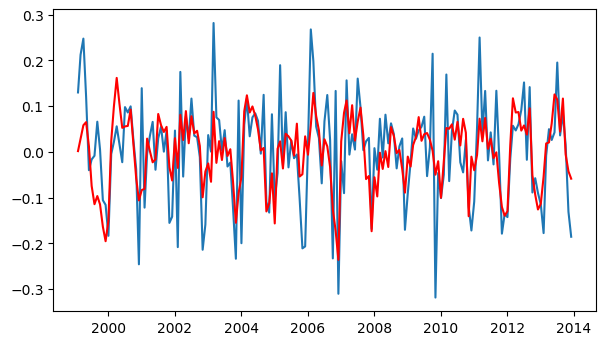

RMSE:  1.1481742840675868


In [1480]:
results_AR_diff_log = AR_model(train_diff_log, diff_log_pacf_val + 10, LOG_DEC_DIFF)

### AR Validate Model Forecast of Log Decomposed Differenced

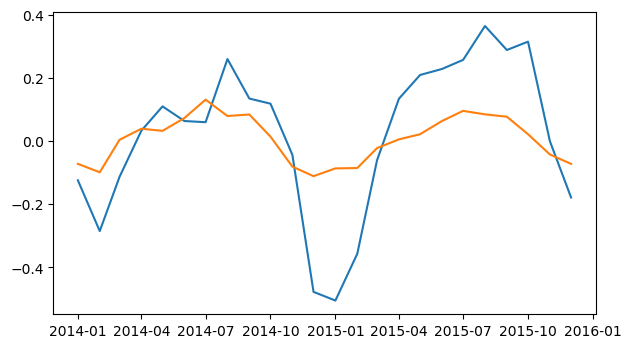

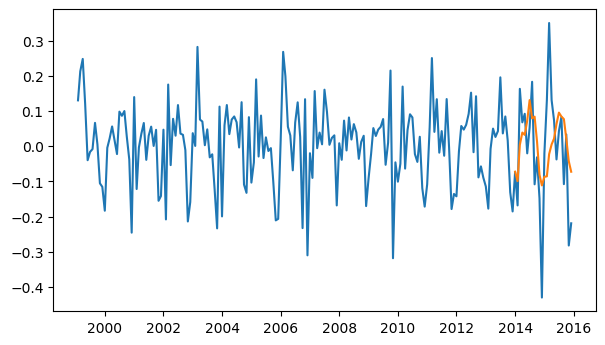

RMSE:  0.1505805776888802


In [1481]:
log_validation(results_AR_diff_log, val_diff_log, train_diff_log, LOG_DEC_DIFF, 'AR')

### MA model of Log Decomposed Differenced

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


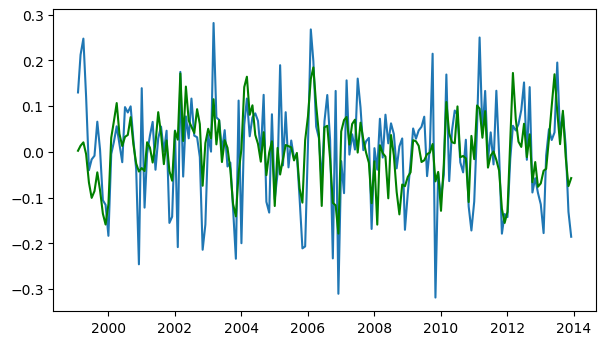

RMSE:  1.1763220431664312


In [1482]:
results_MA_diff_log = MA_model(train_diff_log, diff_log_acf_val + 10, LOG_DEC_DIFF)

### MA Validate Model Forecast of Log Decomposed Differenced

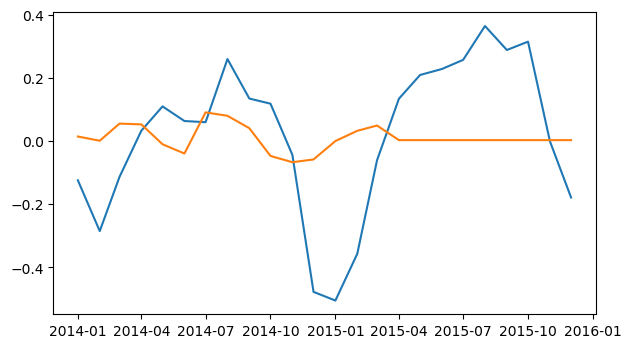

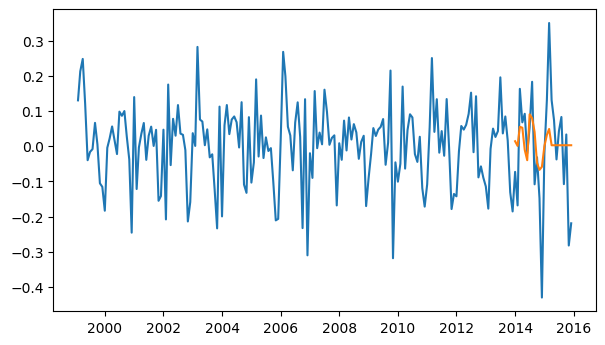

RMSE:  0.14157727854024985


In [1483]:
log_validation(results_MA_diff_log, val_diff_log, train_diff_log, LOG_DEC_DIFF, 'MA')

### ARMA model of Log Decomposed Differenced

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


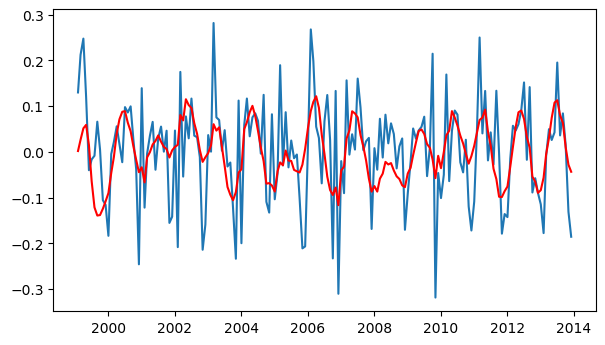

RMSE:  1.2578730891401246


In [1484]:
results_ARMA_diff_log = ARMA_model(train_diff_log, diff_log_pacf_val, diff_log_acf_val - 2, LOG_DEC_DIFF)


### ARMA Validate Model Forecast of Log Decomposed Differenced

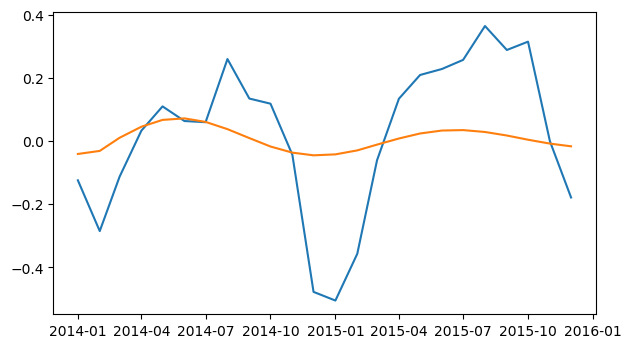

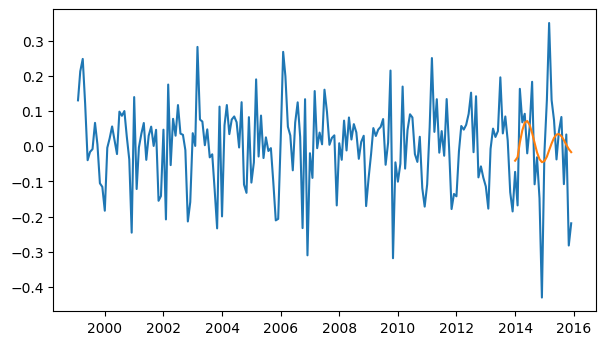

RMSE:  0.1505196574391888


In [1485]:
log_validation(results_ARMA_diff_log, val_diff_log, train_diff_log, LOG_DEC_DIFF, 'ARMA')

### ARIMA model of Log Decomposed Differenced

In [1370]:
# check ARIMA
order_list = [
    (diff_log_pacf_val - 1, 1, diff_log_acf_val - 3),
    (3, 1, 5),
    (0, 1, 7),
]

optimize_ARIMA(order_list, train_log_add)

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum L

,"(p, d, q)",AIC
0,"(3, 1, 5)",-367.759142
1,"(0, 1, 7)",-324.327655
2,"(1, 1, 2)",-283.394780


/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


RMSE:  2.0050065856829855


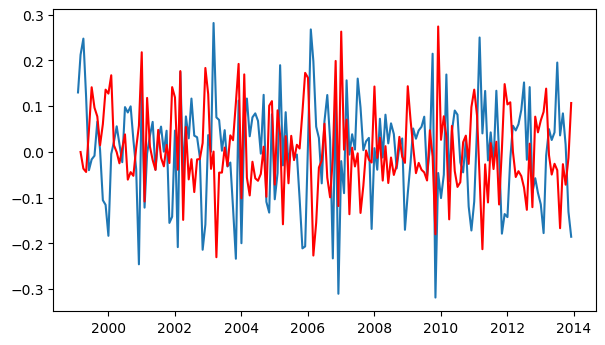

In [1486]:
results_ARIMA_diff_log = ARIMA_model(train_diff_log, diff_log_pacf_val - 1, diff_log_acf_val - 3, LOG_DEC_DIFF)


### ARIMA Validate Model Forecast of Log Decomposed Differenced

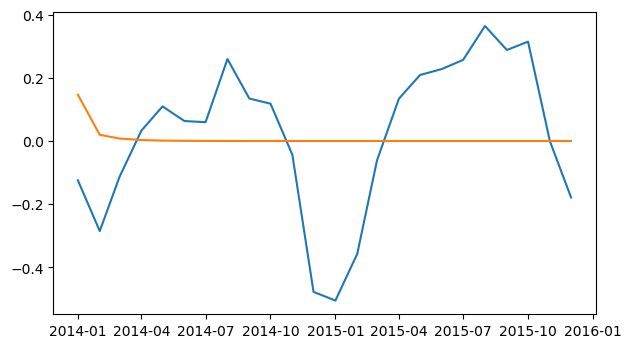

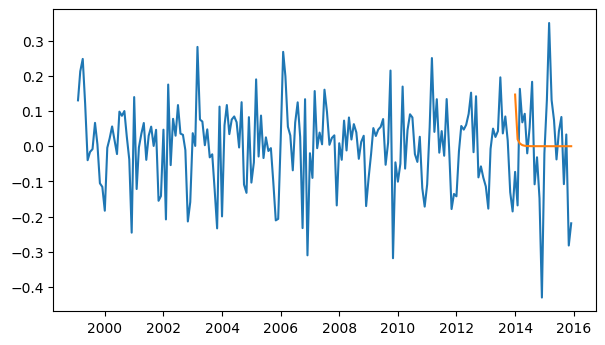

RMSE:  0.1662519780361091


In [1487]:
log_validation(results_ARIMA_diff_log, val_diff_log, train_diff_log, LOG_DEC_DIFF, 'ARIMA')

### 1.3.5 AR, MA, ARMA, ARIMA of Multiplicative Decomposition

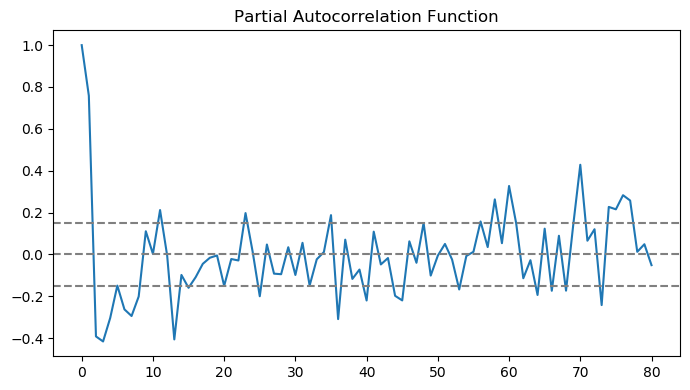

In [1377]:
mul_pacf = pacf(train_mul, nlags=80, method='ols')
pacf_plot(train_mul, mul_pacf)

In [1381]:
mul_pacf_val = 3

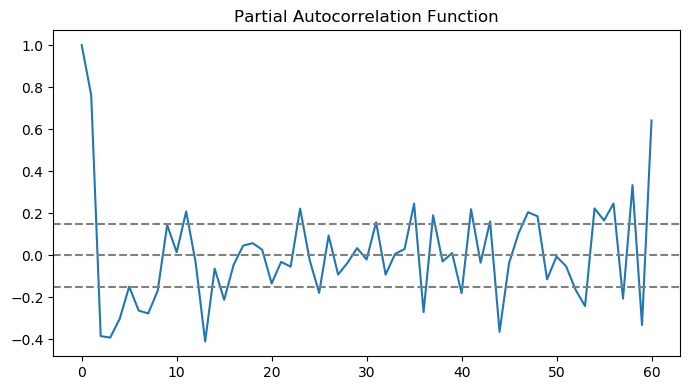

In [1379]:
mul_acf = pacf(train_mul, nlags=60)
pacf_plot(train_mul, mul_acf)

In [1382]:
mul_acf_val = 3

In [1488]:
MUL_DEC = 'Multiplicative Decomposed'

dict_RMSE[TRAIN][MUL_DEC] = deepcopy(dict_models)

In [1490]:
dict_RMSE[VALID][MUL_DEC] = deepcopy(dict_models)
dict_RMSE[TEST][MUL_DEC] = deepcopy(dict_models)

### AR Model of Multiplicative Decomposition

In [1497]:
# check AR
order_list = [
    (1, 0, 0), 
    (3, 0, 0),
    (5, 0, 0),
    (12, 0, 0),
    (19, 0, 0),
    (20, 0, 0)
]

train_mul.index = pd.DatetimeIndex(train_mul.index.values,
                               freq=train_mul.index.inferred_freq)
optimize_ARIMA(order_list, train_mul)

,"(p, d, q)",AIC
0,"(20, 0, 0)",-401.540357
1,"(19, 0, 0)",-400.072619
2,"(12, 0, 0)",-378.451846
3,"(5, 0, 0)",-350.415691
4,"(3, 0, 0)",-334.915517
5,"(1, 0, 0)",-279.632208


In [1495]:
mul_pacf_val_aic = 12

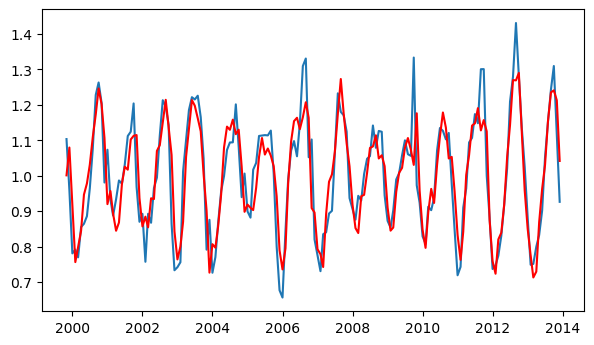

RMSE:  1.0019961542077516


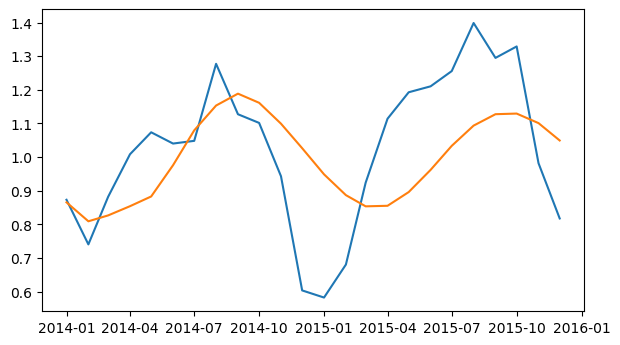

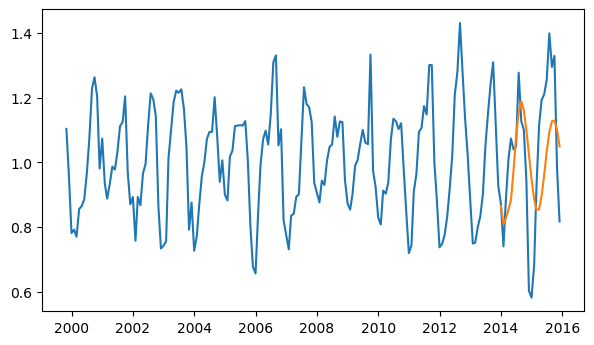

RMSE:  0.5526651966068111


In [1652]:
results_AR_mul = AR_model(train_mul, mul_pacf_val_aic - 5, MUL_DEC)
data_validation(results_AR_mul, val_mul, train_mul, MUL_DEC, 'AR')

### MA Model of Multiplicative Decomposition

In [1498]:
# check AR
order_list = [ 
    (0, 0, 3),
    (0, 0, 7),
    (0, 0, 12),
    (19, 0, 19),
]

train_mul.index = pd.DatetimeIndex(train_mul.index.values,
                               freq=train_mul.index.inferred_freq)
optimize_ARIMA(order_list, train_mul)

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  "Check mle_retvals", ConvergenceWarning)


,"(p, d, q)",AIC
0,"(0, 0, 12)",-369.154846
1,"(0, 0, 7)",-344.281490
2,"(0, 0, 3)",-309.996477


In [1502]:
mul_acf_val_aic = 12

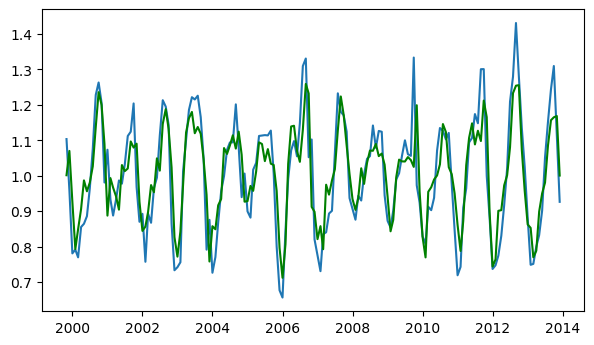

RMSE:  1.0878624229569551


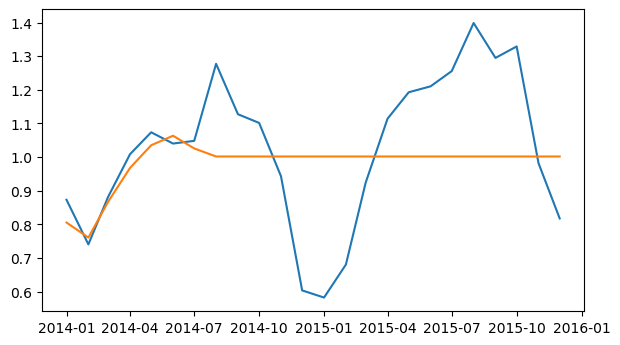

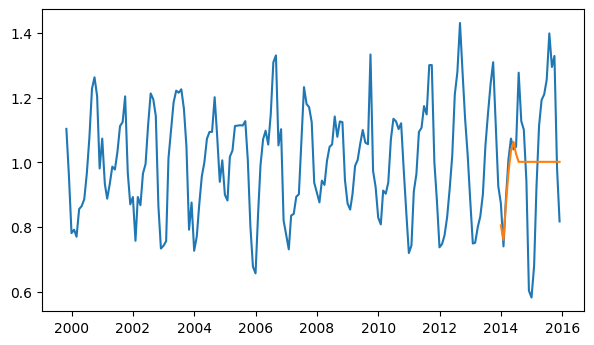

RMSE:  0.6025834909543927


In [1653]:
results_MA_mul = MA_model(train_mul, 7, MUL_DEC)
data_validation(results_MA_mul, val_mul, train_mul, MUL_DEC, 'MA')

### ARMA Model of Multiplicative Decomposition

In [1509]:
# check ARMA
order_list = [ 
    (mul_pacf_val, 0, mul_pacf_val + 4),
    (3, 0, 7),
    (10, 0, 12),
    (8, 0, 3),
]

train_mul.index = pd.DatetimeIndex(train_mul.index.values,
                               freq=train_mul.index.inferred_freq)
optimize_ARIMA(order_list, train_mul)

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:689: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:689: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:690: RuntimeWarning: overflow encountered in exp
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:690: RuntimeWarning: invalid value encountered in true_divide
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Che

,"(p, d, q)",AIC
0,"(8, 0, 3)",-390.500713
1,"(3, 0, 7)",-386.819677
2,"(3, 0, 7)",-386.819677


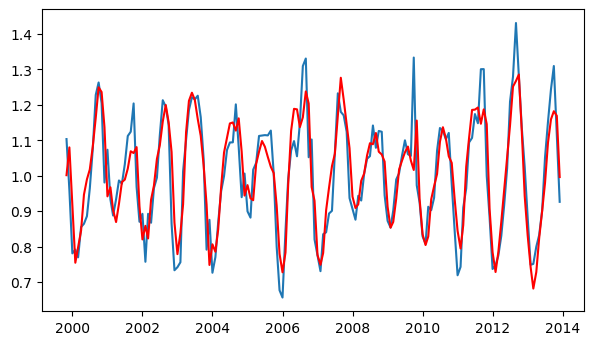

RMSE:  1.0004579125234252


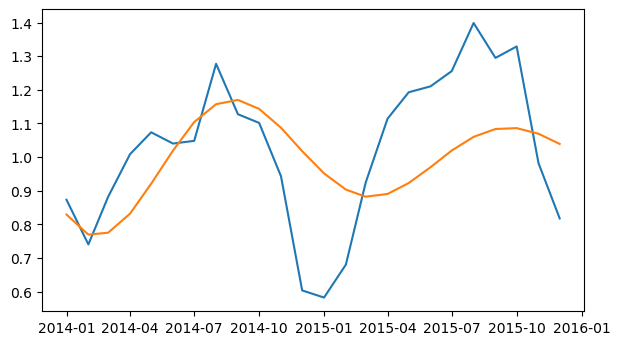

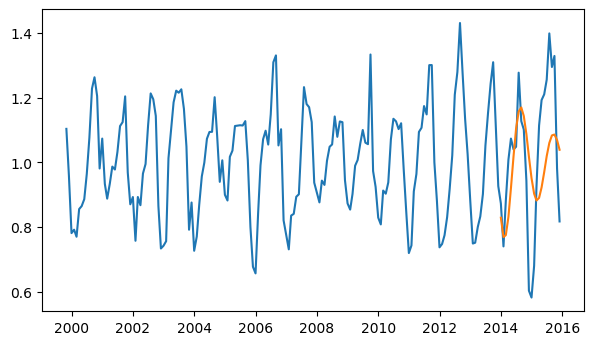

RMSE:  0.5597944026357992


In [1654]:
results_ARMA_mul = ARMA_model(train_mul, 2, 3, MUL_DEC)
data_validation(results_ARMA_mul, val_mul, train_mul, MUL_DEC, 'ARMA')

### ARIMA Model of Multiplicative Decomposition

In [1511]:
# check ARIMA
order_list = [ 
    (mul_pacf_val, 0, mul_pacf_val + 4),
    (3, 1, 7),
    (10, 1, 12),
    (8, 1, 3),
]

train_mul.index = pd.DatetimeIndex(train_mul.index.values,
                               freq=train_mul.index.inferred_freq)
optimize_ARIMA(order_list, train_mul)

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:689: RuntimeWarning: overflow encountered in exp
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:689: RuntimeWarning: invalid value encountered in true_divide
  newparams = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:690: RuntimeWarning: overflow encountered in exp
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:690: RuntimeWarning: invalid value encountered in true_divide
  tmp = ((1-np.exp(-params))/(1+np.exp(-params))).copy()
/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Che

,"(p, d, q)",AIC
0,"(3, 0, 7)",-386.819677
1,"(8, 1, 3)",-364.848032


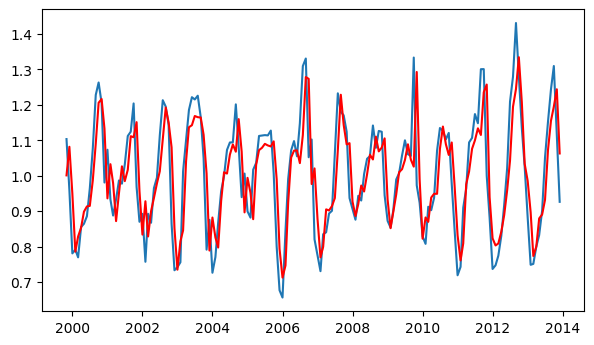

RMSE:  1.2549976298485372


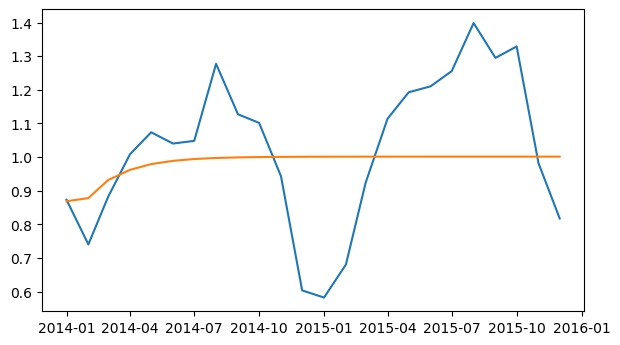

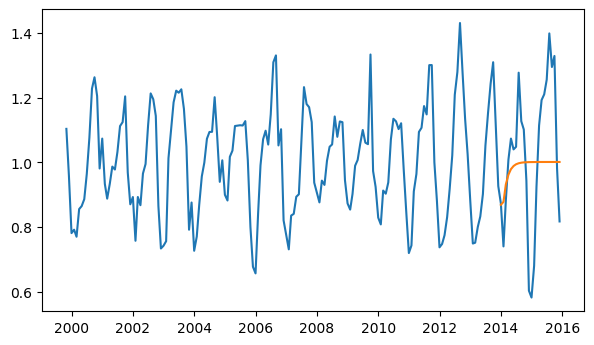

RMSE:  0.6097331155288195


In [1655]:
results_ARMA_mul = ARMA_model(train_mul, 1, 2, MUL_DEC)
data_validation(results_ARMA_mul, val_mul, train_mul, MUL_DEC, 'ARIMA')

### 1.3.6 AR, MA, ARMA, ARIMA of Multiplicative Decomposition Differenced

In [120]:
MUL_DIFF = 'Multiplicative Decomposed Diff'

dict_RMSE[TRAIN][MUL_DIFF] = deepcopy(dict_models)
dict_RMSE[VALID][MUL_DIFF] = deepcopy(dict_models)
dict_RMSE[TEST][MUL_DIFF] = deepcopy(dict_models)

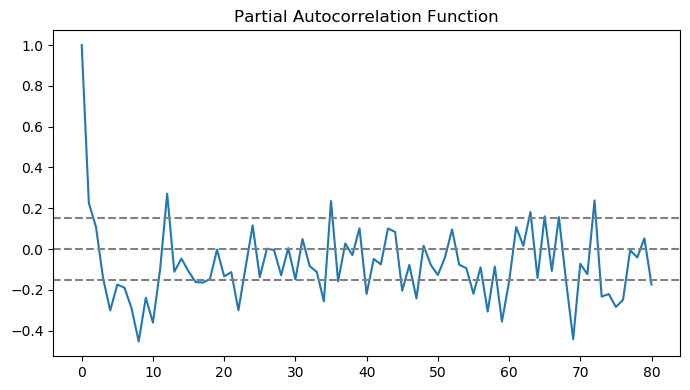

In [1523]:
mul_diff_pacf = pacf(train_mul_diff, nlags=80, method='ols')
pacf_plot(train_mul_diff, mul_diff_pacf)

In [1532]:
mul_diff_pacf_val = 3

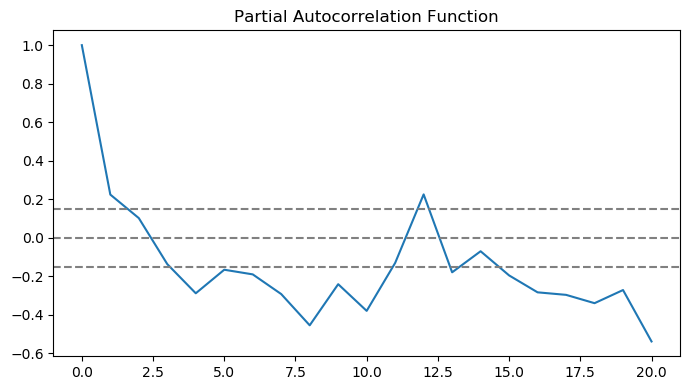

In [1529]:
mul_diff_acf = pacf(train_mul_diff, nlags=20)
pacf_plot(train_mul_diff, mul_diff_acf)

### AR Model of Multiplicative Decomposition Differenced

In [1531]:
# check AR
order_list = [
    (3, 0, 0),
    (5, 0, 0),
    (12, 0, 0),
    (19, 0, 0)
]

train_mul_diff.index = pd.DatetimeIndex(train_mul_diff.index.values,
                               freq=train_mul_diff.index.inferred_freq)
optimize_ARIMA(order_list, train_mul_diff)

,"(p, d, q)",AIC
0,"(19, 0, 0)",-371.644147
1,"(12, 0, 0)",-370.045268
2,"(5, 0, 0)",-282.892339
3,"(3, 0, 0)",-266.540875


In [116]:
mul_diff_pacf_aic = 19

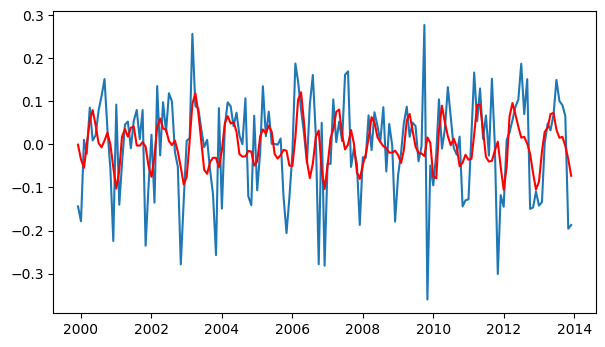

RMSE:  1.3071897747961412


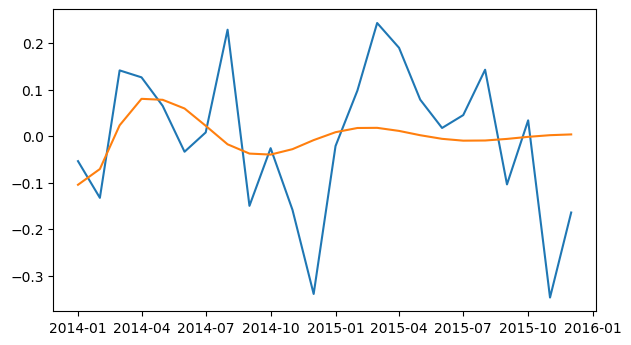

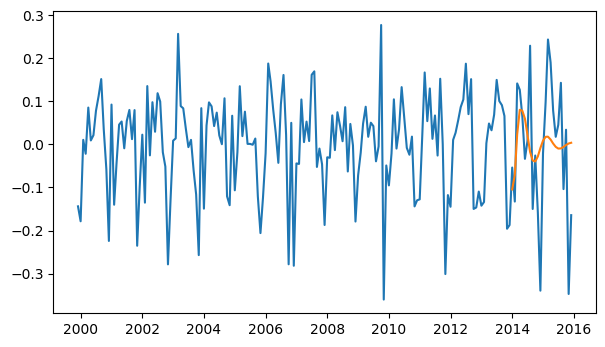

RMSE:  0.14200128581572752


In [1543]:
results_AR_mul_diff = AR_model(train_mul_diff, mul_diff_pacf_aic, MUL_DIFF)
data_validation(results_AR_mul_diff, val_mul_diff, train_mul_diff, MUL_DIFF, 'AR')

### MA Model of Multiplicative Decomposition Differenced

In [1535]:
# check AR
order_list = [
    (0, 0, 3),
    (0, 0, 5),
    (0, 0, 12),
    (0, 0, 19)
]

optimize_ARIMA(order_list, train_mul_diff)

,"(p, d, q)",AIC
0,"(0, 0, 5)",-305.389559
1,"(0, 0, 3)",-268.253328


In [115]:
mul_diff_acf_aic = 5

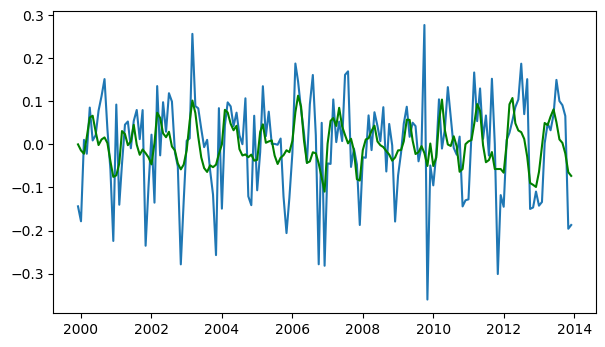

RMSE:  1.2226519996564371


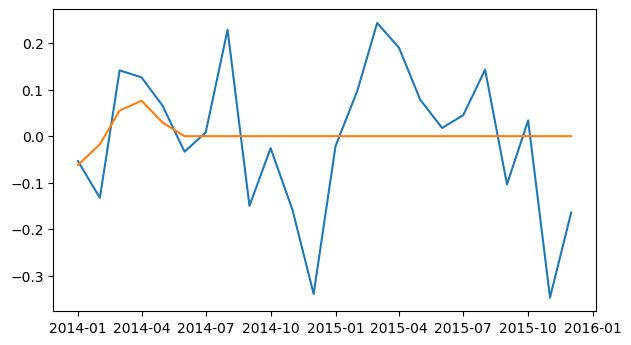

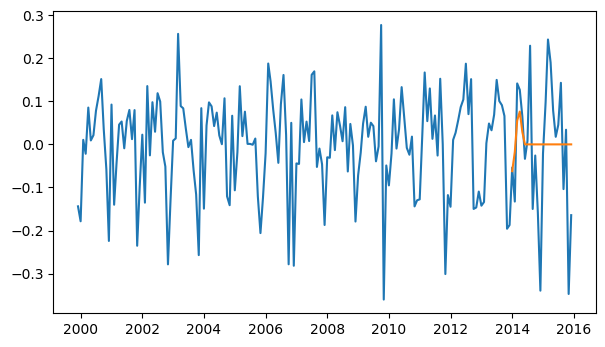

RMSE:  0.14443703267472616


In [1715]:
results_MA_mul_diff = MA_model(train_mul_diff, mul_diff_acf_aic, MUL_DIFF)
data_validation(results_MA_mul_diff, val_mul_diff, train_mul_diff, MUL_DIFF, 'MA')


### ARMA Model of Multiplicative Decomposition Differenced

In [1731]:
# check AR
order_list = [
    (7, 0, 3),
    (1, 0, 2),
    (2, 0, 3),
    (4, 0, 7),
    (1, 0, 5),
    (2, 0, 5)
]

optimize_ARIMA(order_list, train_mul_diff)

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:689: RuntimeWarning:

overflow encountered in exp

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:689: RuntimeWarning:

invalid value encountered in true_divide

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:690: RuntimeWarning:

overflow encountered in exp

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/tsatools.py:690: RuntimeWarning:

invalid value encountered in true_divide

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:568: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/sofiapetryshyn/opt/anaconda3/

,"(p, d, q)",AIC
0,"(7, 0, 3)",-382.147293
1,"(2, 0, 3)",-368.553544
2,"(2, 0, 5)",-365.687722
3,"(1, 0, 2)",-284.384616


/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available



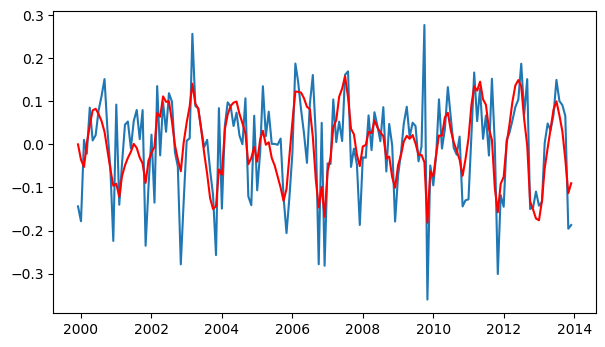

RMSE:  1.0164877309185534


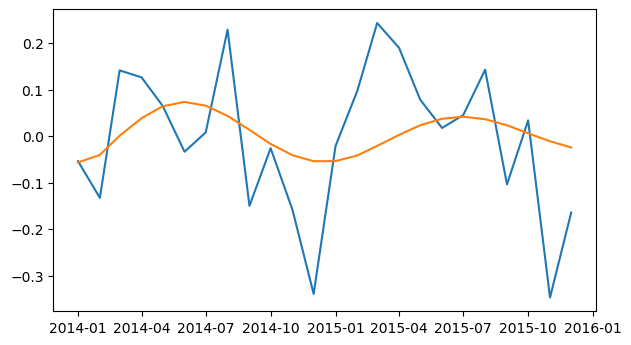

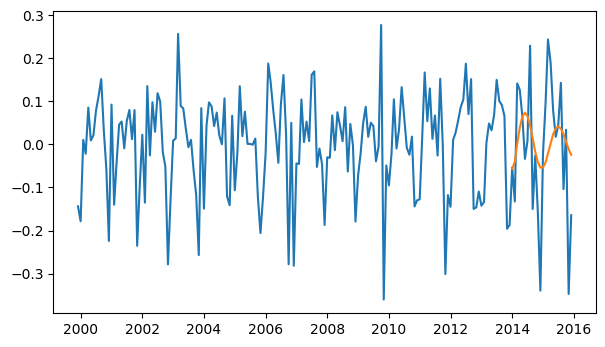

RMSE:  0.14019498724689597


In [1732]:
results_ARMA_mul_diff = ARMA_model(train_mul_diff, 2, 3, MUL_DIFF)
data_validation(results_ARMA_mul_diff, val_mul_diff, train_mul_diff, MUL_DIFF, 'ARMA')

### ARIMA Model of Multiplicative Decomposition Differenced

RMSE:  1.97959937403677


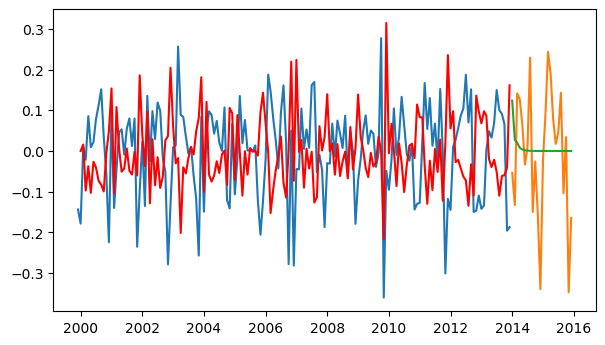

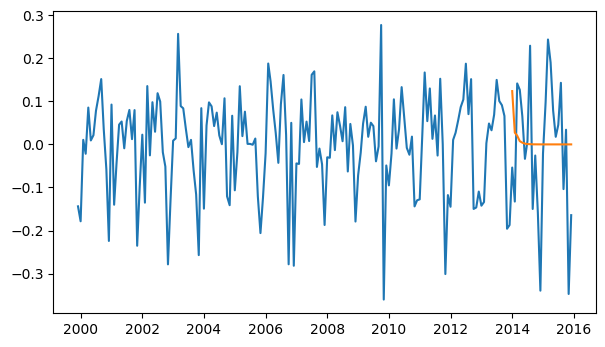

RMSE:  0.15411562378664573


In [1577]:
results_ARIMA_mul_diff = ARIMA_model(train_mul_diff, 2, 1, MUL_DIFF)
data_validation(results_ARIMA_mul_diff, val_mul_diff, train_mul_diff, MUL_DIFF, 'ARIMA')

## Prepare Data RMSE for validation analysis

In [73]:
def form_data_type_for_each_model(d, TRAIN_VAL_TEST, num_mod):
    arr = []
    for key in d[TRAIN_VAL_TEST].keys():
        for i in range(0, num_mod):
            arr.append(key)
    return arr

def form_each_model_for_data_type(d, TRAIN_VAL_TEST, all_models_names_dublicate):
    arr = []
    for i in range(0, all_models_names_dublicate):
        for key in (d[TRAIN_VAL_TEST][LOG_DEC]).keys():
            arr.append(key)
    return arr

def form_values_for_data_model(d, TRAIN_VAL_TEST):
    arr = []
    for data in d[TRAIN_VAL_TEST].keys():
        for model in d[TRAIN_VAL_TEST][data].keys():
            arr.append(d[TRAIN_VAL_TEST][data][model])
    return arr

In [74]:
train_df = pd.DataFrame(index=[i for i in range(0, len(dict_RMSE['train'].keys()) * 4)])
    
arr_data_types = form_data_type_for_each_model(dict_RMSE, 'train', 4)
train_df['data prepared'] = pd.Series(arr_data_types)

arr_model_types = form_each_model_for_data_type(dict_RMSE, 'train', 6)
train_df['model used'] = pd.Series(arr_model_types)

arr_model_values = form_values_for_data_model(dict_RMSE, 'train')
train_df['value'] = pd.Series(arr_model_values)

In [75]:
val_df = pd.DataFrame(index=[i for i in range(0, len(dict_RMSE['valid'].keys()) * 4)])
    
arr_data_types = form_data_type_for_each_model(dict_RMSE, 'valid', 4)
val_df['data prepared'] = pd.Series(arr_data_types)

arr_model_types = form_each_model_for_data_type(dict_RMSE, 'valid', 6)
val_df['model used'] = pd.Series(arr_model_types)

arr_model_values = form_values_for_data_model(dict_RMSE, 'valid')
val_df['value'] = pd.Series(arr_model_values)

In [76]:
# val_df

In [77]:
fig = px.bar(train_df[train_df['data prepared'].isin([DEC, DIFF])],
             x="data prepared", color="model used",
             y='value',
             title="A Grouped Bar Chart For Additive Decomposed Data",
             barmode='group',
             height=700,
            )

fig.show()

In [1744]:
fig = px.bar(val_df[val_df['data prepared'].isin([DEC, DIFF])],
             x="data prepared", color="model used",
             y='value',
             title="A Grouped Bar Chart For Additive Decomposed Validation Data",
             barmode='group',
             height=700,
            )

fig.show()

In [1745]:
fig = px.bar(train_df[~train_df['data prepared'].isin([DEC, DIFF])],
             x="data prepared", color="model used",
             y='value',
             title="A Grouped Bar Chart For Train Logarithmed Additive Decomposed and Multiplicative Decomposed Data",
             barmode='group',
             height=700,
#              facet_row="model used"
            )

fig.show()

In [1746]:
fig = px.bar(val_df[~val_df['data prepared'].isin([DEC, DIFF])],
             x="data prepared", color="model used",
             y='value',
             title="A Grouped Bar Chart For Validation Logarithmed Additive Decomposed and Multiplicative Decomposed Data",
             barmode='group',
             height=700,
#              facet_row="model used"
            )

fig.show()

### Bars analysis:

#### About the data preparation:
From the plot bars above, we can see that Additive Decomposition performs the worst.
1. First two plots show us the rate of RMSE over Production data applying on which Additive Decomposition.\
    We can see that average value for the RMSE is above 150, what signals us that our data can be better decomposed in terms of Multiplicative Model.
2. The next four plots represent: 
       * the logarithmic data decomposed with Additive Model,
       * the logarithmic data decomposed with Additive Model and differenced,
       * the data decomposed with Multiplicative Model,
       * the data decomposed with Multiplicative Model and differenced.
   We can see that average RMSE here is smaller in 150 times, what is a huge number!\
   **How can we describe these results?**\
   Applying logarithm over the data and then taking additive decomposition over it is equivalent to the product of logarithmic data features, so in other words, the logarithmic data decomposed with Additive Model behaves itself inside models as a data with a Multiplicative Decomposition.\
   If we move forward to see how Models with the data with Multiplicative Decomposition and Differenced Multiplicative Decomposition perform, we can see that they perform good.\
   **Validation data:**\
   On the plots of validation data, we can definitely drop the Additive Decomposed Data. We can see that Multiplicative Decomposition shows the worst RMSE for the validation data, so we wouldn't take this model for forecast and for training.\
   Data preparations that perform good on train and validation sets are: \
       1. the logarithmic data decomposed with Additive Model,
       2. the data decomposed with Multiplicative Model and differenced.
   So we will test the models on these data and decide wether it is reasonable to forecast with this way prepared data.

   
#### About the model that describe the data:
    We will test the data over AR, MA and ARIMA models.\
    
So, we will test and forecast on:
    1. the logarithmic data decomposed with Additive Model,
    2. the data decomposed with Multiplicative Model and differenced.
Over AR, MA, ARMA models.

## Test and Forecast

### Test Logarithmic Additive Decomposition

In [82]:
def test_data_log(model_results, test_data, train_data, data_type, model_type):
    ff = model_results.predict(start=test_data.index[0], end=test_data.index[-1])
    ff = pd.DataFrame(ff,index = test_data.index)
    plt.plot(pd.concat([test_data,ff],axis=1))
    plt.show()
    train_val_df = pd.concat([train_data.append(test_data),ff],axis=1)
    plt.plot(train_val_df)
    plt.show()
    RMSE = np.sqrt(mean_squared_error(np.exp(ff), np.exp(test_data)))
    dict_RMSE[TEST][data_type][model_type] = RMSE
    print('RMSE: ', RMSE)

In [97]:
train_val_log_add = pd.concat([train_log_add, val_log_add])

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



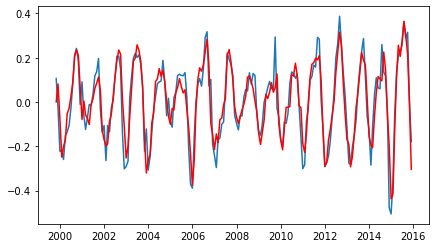

RMSE:  0.9785282282108992


In [108]:
def AR_model_test(data, p, data_type):
    '''
    data_type: DEC or DIFF or ...
    '''
    model = ARIMA(data, order=(p, 0, 0))
    results_AR = model.fit(disp=-1)
    plt.plot(data)
    plt.plot(results_AR.fittedvalues, color='red')
    plt.show()
    ar_rmse = np.sqrt(sum((results_AR.fittedvalues.values-data.values)**2))
    print('RMSE: ', ar_rmse)
    return results_AR, ar_rmse

results_AR_log_add_test, ar_rmse_log_add_test = AR_model_test(train_val_log_add, log_pacf_val, LOG_DEC)

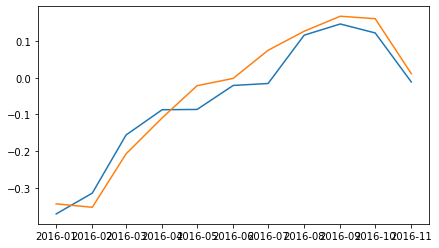

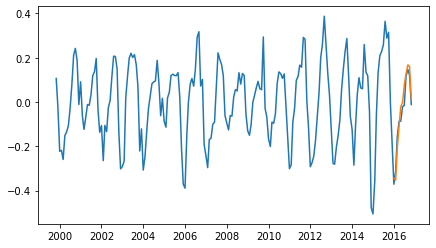

RMSE:  0.04209201615452378


In [109]:
test_data_log(results_AR_log_add_test, test_log_add, train_val_log_add, LOG_DEC, 'AR')

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:548: HessianInversionWarning:

Inverting hessian failed, no bse or cov_params available

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/base/model.py:568: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



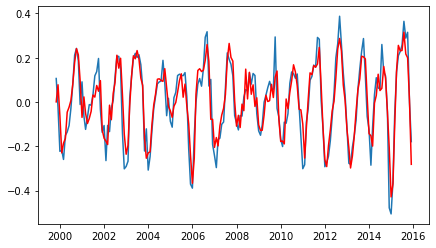

RMSE:  1.023725882029127


In [110]:
def MA_model_test(data, q, data_type):
    '''
    data_type: DEC or DIFF or ...
    '''
    model = ARIMA(data, order=(0, 0, q))
    results_MA = model.fit(disp=-1)
    plt.plot(data)
    plt.plot(results_MA.fittedvalues, color='red')
    plt.show()
    ar_rmse = np.sqrt(sum((results_MA.fittedvalues.values-data.values)**2))
    print('RMSE: ', ar_rmse)
    return results_MA, ar_rmse

results_MA_log_add_test, ma_rmse_log_add_test = MA_model_test(train_val_log_add, log_pacf_val + 1, LOG_DEC)

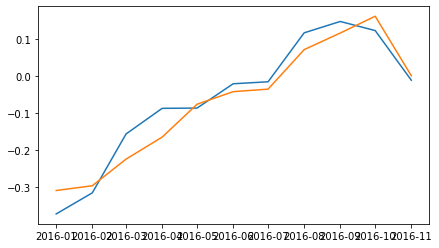

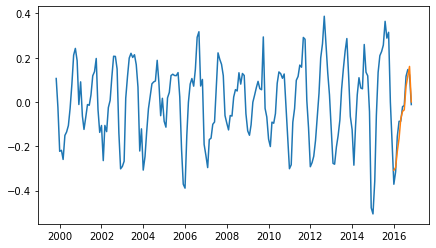

RMSE:  0.039010118104318016


In [111]:
test_data_log(results_MA_log_add_test, test_log_add, train_val_log_add, LOG_DEC, 'MA')

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



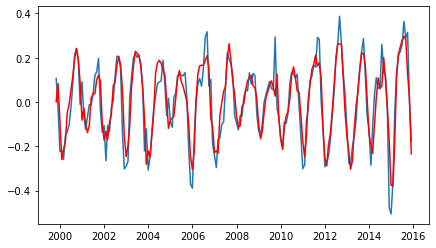

RMSE:  1.0702903929034675


In [112]:
def ARMA_model_test(data, p, q, data_type):
    '''
    data_type: DEC or DIFF or ...
    '''
    model = ARIMA(data, order=(p, 0, q))
    results_MA = model.fit(disp=-1)
    plt.plot(data)
    plt.plot(results_MA.fittedvalues, color='red')
    plt.show()
    ar_rmse = np.sqrt(sum((results_MA.fittedvalues.values-data.values)**2))
    print('RMSE: ', ar_rmse)
    return results_MA, ar_rmse

results_ARMA_log_add_test, arma_rmse_log_add_test = ARMA_model_test(train_val_log_add, 3, 7, LOG_DEC)

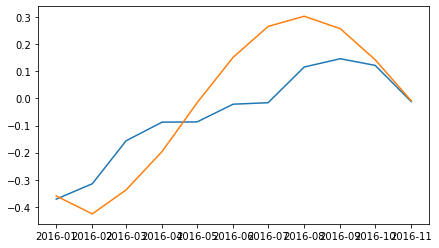

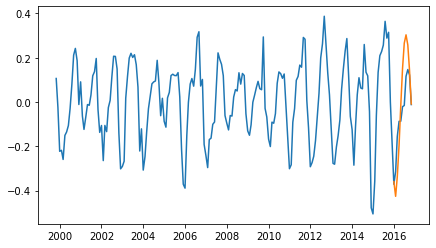

RMSE:  0.1503423945188243


In [113]:
test_data_log(results_ARMA_log_add_test, test_log_add, train_val_log_add, LOG_DEC, 'ARMA')

In [114]:
arr_log_add_test = [
    ar_rmse_log_add_test,
    ma_rmse_log_add_test,
    arma_rmse_log_add_test
]

### Test Differenced Multiplicative Decomposition

In [117]:
train_val_diff_mul = pd.concat([train_mul_diff, val_mul_diff])

In [121]:
def test_data(model_results, test_data, train_data, data_type, model_type):
    ff = model_results.predict(start=test_data.index[0], end=test_data.index[-1])
    ff = pd.DataFrame(ff,index = test_data.index)
    plt.plot(pd.concat([test_data,ff],axis=1))
    plt.show()
    train_val_df = pd.concat([train_data.append(test_data),ff],axis=1)
    plt.plot(train_val_df)
    plt.show()
    RMSE = np.sqrt(mean_squared_error(ff, test_data))
    dict_RMSE[TEST][data_type][model_type] = RMSE
    print('RMSE: ', RMSE)

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



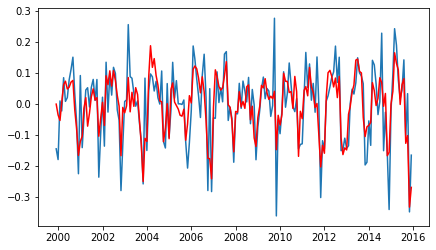

RMSE:  1.017290656193936


In [122]:
results_AR_diff_mul_test, ar_rmse_diff_mul_test = AR_model_test(train_val_diff_mul, mul_diff_pacf_aic, MUL_DIFF)

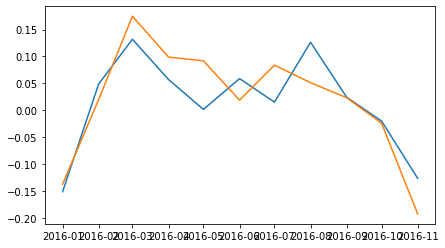

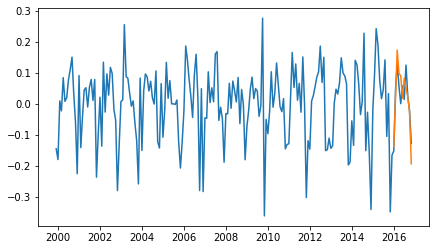

RMSE:  0.051375717290662065


In [123]:
test_data(results_AR_diff_mul_test, test_mul_diff, train_val_diff_mul, MUL_DIFF, 'AR')

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



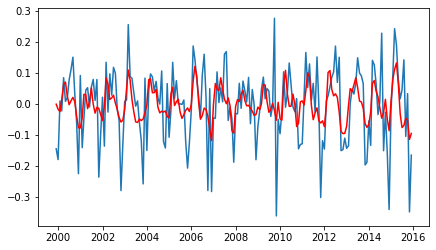

RMSE:  1.3587587985405427


In [124]:
results_MA_diff_mul_test, ma_rmse_diff_mul_test = MA_model_test(train_val_diff_mul, mul_diff_acf_aic, MUL_DIFF)

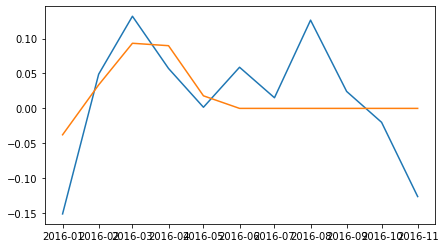

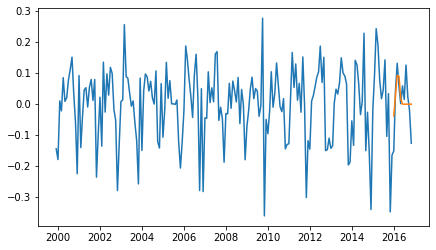

RMSE:  0.06902532340286785


In [125]:
test_data(results_MA_diff_mul_test, test_mul_diff, train_val_diff_mul, MUL_DIFF, 'MA')

/Users/sofiapetryshyn/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tsa/base/tsa_model.py:162: ValueWarning:

No frequency information was provided, so inferred frequency MS will be used.



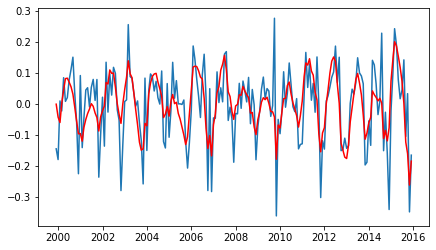

RMSE:  1.1332704015633146


In [126]:
results_ARMA_diff_mul_test, arma_rmse_diff_mul_test = ARMA_model_test(train_val_diff_mul, 2, 3, MUL_DIFF)



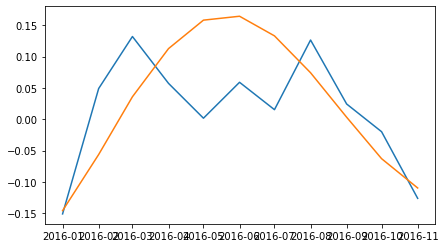

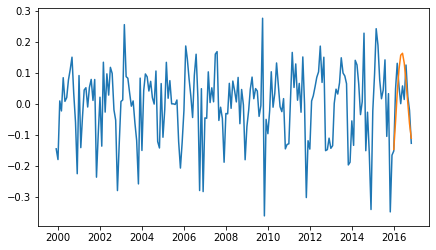

RMSE:  0.08423230738271555


In [127]:
test_data(results_ARMA_diff_mul_test, test_mul_diff, train_val_diff_mul, MUL_DIFF, 'ARMA')

In [128]:
arr_diff_mul_test = [
    ar_rmse_diff_mul_test,
    ma_rmse_diff_mul_test, 
    arma_rmse_diff_mul_test
]

## Prepare Data RMSE for test analysis

Here `arr_log_add_test` and here `arr_diff_mul_test` we have RMSE after the model training over train and validation data.

#### Prepare test RMSE

In [131]:
del dict_RMSE['test'][DEC]
del dict_RMSE['test'][DIFF]
del dict_RMSE['test'][LOG_DEC_DIFF]
del dict_RMSE['test'][MUL_DEC]

KeyError: 'Diff'

In [132]:
del dict_RMSE['test'][LOG_DEC]['ARIMA']
del dict_RMSE['test'][MUL_DIFF]['ARIMA']

In [133]:
dict_RMSE['test']

{'Log Decomposed': {'AR': 0.04209201615452378,
  'ARMA': 0.1503423945188243,
  'MA': 0.039010118104318016},
 'Multiplicative Decomposed Diff': {'AR': 0.051375717290662065,
  'ARMA': 0.08423230738271555,
  'MA': 0.06902532340286785}}

In [134]:
test_df = pd.DataFrame(index=[i for i in range(0, len(dict_RMSE['test'].keys()) * 3)])
    
arr_data_types = form_data_type_for_each_model(dict_RMSE, 'test', 3)
test_df['data prepared'] = pd.Series(arr_data_types)

arr_model_types = form_each_model_for_data_type(dict_RMSE, 'test', 2)
test_df['model used'] = pd.Series(arr_model_types)

arr_model_values = form_values_for_data_model(dict_RMSE, 'test')
test_df['value'] = pd.Series(arr_model_values)

In [135]:
test_df

,data prepared,model used,value
0,Log Decomposed,AR,0.042092
1,Log Decomposed,MA,0.039010
2,Log Decomposed,ARMA,0.150342
3,Multiplicative Decomposed Diff,AR,0.051376
4,Multiplicative Decomposed Diff,MA,0.069025
5,Multiplicative Decomposed Diff,ARMA,0.084232


#### Prepare train & validation RMSE

In [136]:
train_val_df = test_df.copy()
tr_val_rmse = arr_log_add_test + arr_diff_mul_test
train_val_df['value'] = pd.Series(tr_val_rmse)

In [137]:
train_val_df

,data prepared,model used,value
0,Log Decomposed,AR,0.978528
1,Log Decomposed,MA,1.023726
2,Log Decomposed,ARMA,1.070290
3,Multiplicative Decomposed Diff,AR,1.017291
4,Multiplicative Decomposed Diff,MA,1.358759
5,Multiplicative Decomposed Diff,ARMA,1.133270


### Show Train & Validation RMSE

In [138]:
fig = px.bar(train_val_df,
             x="data prepared", color="model used",
             y='value',
             title="A Grouped Bar Chart For TEST Logarithmed Additive Decomposed and Diff Multiplicative Decomposed Data",
             barmode='group',
             height=700,
#              facet_row="model used"
            )

fig.show()

### Show Test RMSE

In [139]:
fig = px.bar(test_df,
             x="data prepared", color="model used",
             y='value',
             title="A Grouped Bar Chart For TEST Logarithmed Additive Decomposed and Diff Multiplicative Decomposed Data",
             barmode='group',
             height=700,
#              facet_row="model used"
            )

fig.show()

### Analysis of the RMSEs of the test data
We can notice that the models AR and MA shows better result than ARMA. However, on the plots of train and validation data ARMA also have had good results in comparison with AR and MA models.\
However, MA on Differenced Multiplicative Decomposed catches the mean, so it is not a good model. We can regect it.\
AR model makes predictions based on the logs, so out of the result of the data we can say, that our model based on loggs. MA model makes the data more smooth, so we predict the data tragectory, I would say, but not the datails of the small lags, that AR tells us.\
ARMA model combines both things, so it gives us good fit as for a tragectory, as for the lags of the model.\
In our case, **ARMA can perform worse** as we can have small gaps with AR or MA forecasted models and real data, and if these gaps are filled with small lags, the root mean squared error can be larger than after AR or MA forecast.\
Never the less, AR, MA and ARMA shows good performance on the Log Decomposed and Diff Mul Decomposed data.\
We can try to forecast the data using MA model over Logarithmic Data and AR model over Differenced Mul Decomposed data.

## Validation with Prophet

### Validate Log Additive Decomposed Data

In [292]:
m = Prophet(seasonality_mode='multiplicative',
                growth='linear',
                yearly_seasonality=True,
                weekly_seasonality=True,
                daily_seasonality=True)

In [293]:
m.add_seasonality(name='monthly',
                  period=4,
                  fourier_order=6)

In [295]:
df = pd.DataFrame()
df["ds"] = pd.Series(train_val_log_add.index)
df["y"] = pd.Series(train_val_log_add.values)

df['floor'] = np.min(df['y'])
df['cap'] = np.max(df['y']) + (np.max(df['y']) *0.2)

In [296]:
m.fit(df)

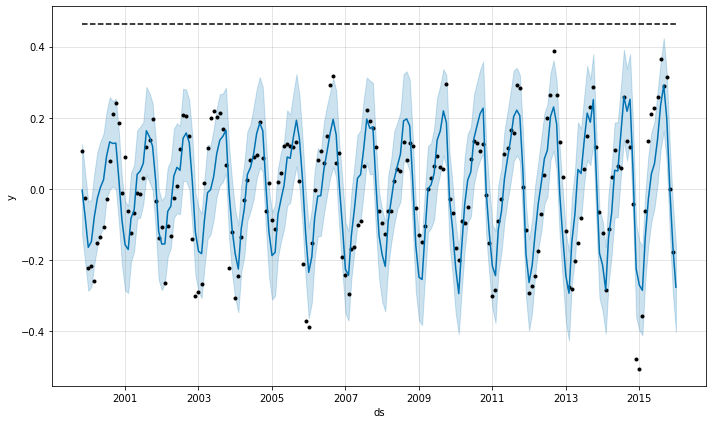

In [297]:
future = m.make_future_dataframe(periods=1, include_history=True, freq="y")
future['floor'] = df['y'].min()
future['cap'] = df['y'].max() + (df['y'].max() *0.2)

forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

fig1 = m.plot(forecast)

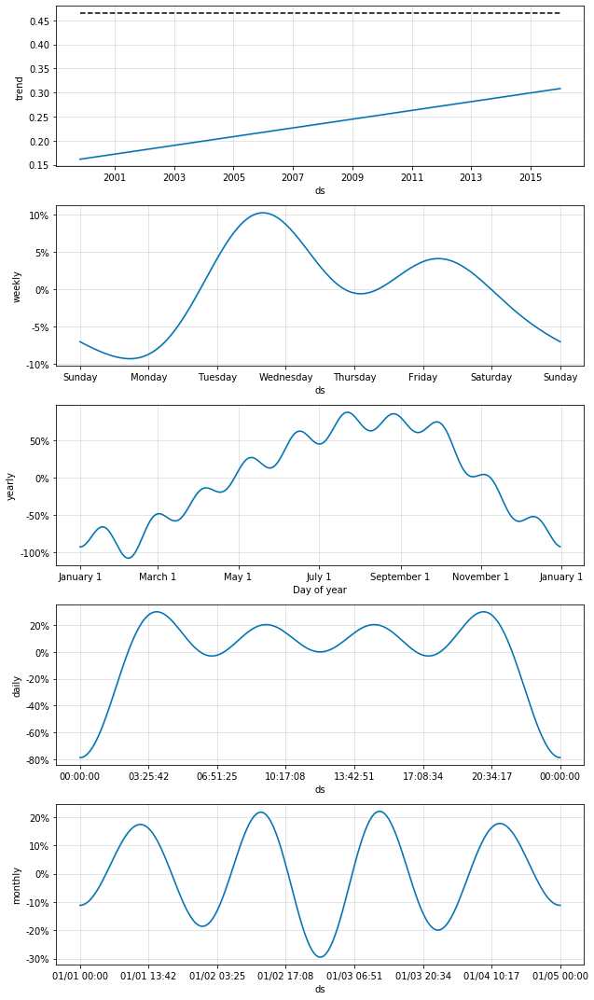

In [298]:
fig = m.plot_components(forecast)

In [272]:
mask = (forecast['ds'] > val_log_add.index[0]) & (forecast['ds'] <= val_log_add.index[-1])

In [280]:
msre_log_add_fb = np.sqrt(np.sum(val_log_add[:-1].values - forecast.loc[mask]['yhat'].values)**2)
print("MSRE of the validation data over Log Additive Decomposed data: ", msre_log_add_fb)

MSRE of the validation data over Log Additive Decomposed data:  0.2036553963834379


### Validate Diff Multiplicative Decomposed Data

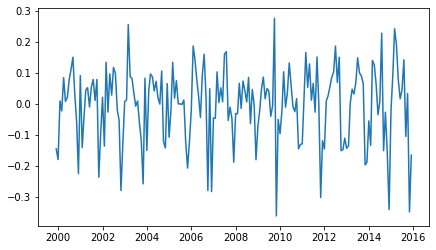

In [283]:
plt.plot(train_val_diff_mul)

In [284]:
m2 = Prophet(seasonality_mode='multiplicative',
                growth='linear',
                yearly_seasonality=True,
                weekly_seasonality=True,
                daily_seasonality=True)

In [285]:
m2.add_seasonality(name='monthly',
                  period=4,
                  fourier_order=6)

In [286]:
df2 = pd.DataFrame()
df2["ds"] = pd.Series(train_val_diff_mul.index)
df2["y"] = pd.Series(train_val_diff_mul.values)

df2['floor'] = np.min(df2['y'])
df2['cap'] = np.max(df2['y']) + (np.max(df2['y']) *0.2)

In [287]:
m2.fit(df2)

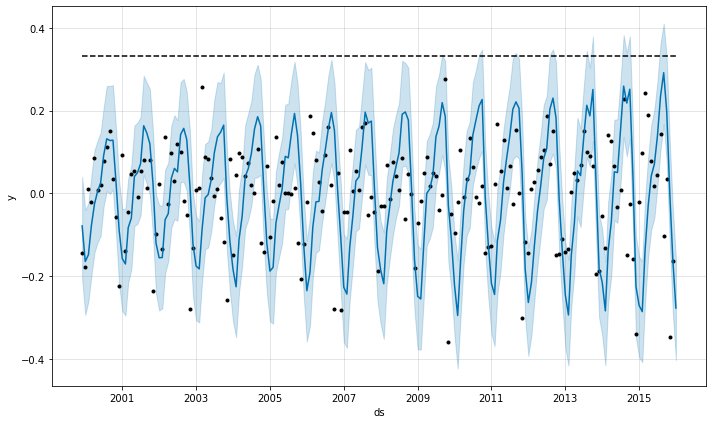

In [288]:
future2 = m2.make_future_dataframe(periods=1, include_history=True, freq="y")
future2['floor'] = df2['y'].min()
future2['cap'] = df2['y'].max() + (df2['y'].max() *0.2)

forecast2 = m.predict(future2)
forecast2[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

fig2 = m2.plot(forecast2)

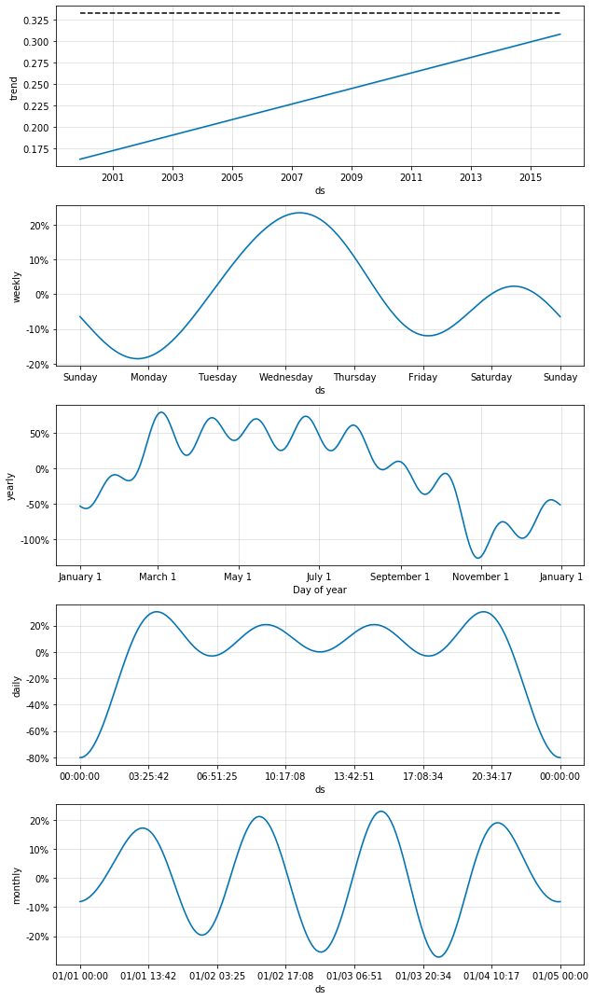

In [290]:
fig2 = m2.plot_components(forecast2)

In [301]:
mask2 = (forecast2['ds'] > val_mul_diff.index[0]) & (forecast2['ds'] <= val_mul_diff.index[-1])
msre_log_add_fb2 = np.sqrt(np.sum(val_mul_diff[:-1].values - forecast2.loc[mask2]['yhat'].values)**2)
print("MSRE of the validation data over Log Additive Decomposed data: ", msre_log_add_fb2)

MSRE of the validation data over Log Additive Decomposed data:  0.3416404138213819


In [304]:
print("\t MSRE Log Add Dec", round(msre_log_add_fb, 2) , "\t\t & \t\tMSRE Diff Mul Dec: ", round(msre_log_add_fb2, 2))

	 MSRE Log Add Dec 0.2 		 & 		MSRE Diff Mul Dec:  0.34


In [419]:
dict_RMSE

{'test': {'Log Decomposed': {'AR': 0.04209201615452378,
   'ARMA': 0.1503423945188243,
   'MA': 0.039010118104318016},
  'Multiplicative Decomposed Diff': {'AR': 0.051375717290662065,
   'ARMA': 0.08423230738271555,
   'MA': 0.06902532340286785}},
 'train': {'Decomposed': {'AR': 192.65281671911177,
   'ARIMA': 0,
   'ARMA': 0,
   'MA': 0},
  'Diff': {'AR': 0, 'ARIMA': 0, 'ARMA': 0, 'MA': 0},
  'Log Decomposed': {'AR': 0, 'ARIMA': 0, 'ARMA': 0, 'MA': 0},
  'Log Decomposed Diff': {'AR': 0, 'ARIMA': 0, 'ARMA': 0, 'MA': 0},
  'Multiplicative Decomposed Diff': {'AR': 0, 'ARIMA': 0, 'ARMA': 0, 'MA': 0}},
 'valid': {'Decomposed': {'AR': 7.860079530217604e+31,
   'ARIMA': 0,
   'ARMA': 0,
   'MA': 0},
  'Diff': {'AR': 0, 'ARIMA': 0, 'ARMA': 0, 'MA': 0},
  'Log Decomposed': {'AR': 0, 'ARIMA': 0, 'ARMA': 0, 'MA': 0},
  'Log Decomposed Diff': {'AR': 0, 'ARIMA': 0, 'ARMA': 0, 'MA': 0},
  'Multiplicative Decomposed Diff': {'AR': 0, 'ARIMA': 0, 'ARMA': 0, 'MA': 0}}}

## Conclusions :
#### Conslusions of the validation:
    We have made two validations:
1. **Log Additive Decomposed Data** (WINNER!)
2. Diff Multiplicative DEcomposed Data
    Validation works better on Log Additive Decomposed Data, but actually the difference is quite small.
#### From plots, we can see:
* We can see that the data is definitely multiplicative, as the trend grows up.
* We see that from spring to the early autumn we have grows of production, and for the winter we have decrease in the bussiness.
* We can see that usually production is bought in the middle of the month.
* And in the middle of the week, with small increase on the weekend.
* Daily season is described by 6 orders of Furier Series, they don't really explain the data for us.

### Concliusions of the model that worth to be used:
1. AR - shows a changing variable that regresses on its own lagged, or prior, values. In our case this model performed quite good. The paramether - the number of lag observations in the model was chosen using AIC method as well as PACF.
2. MA - incorporates the dependency between an observation and a residual error from a moving average model applied to lagged observations. This model also has shown good results. The paramether of the size of the moving average window was chosen with AIC and ACF models.
3. ARMA - the combination of AR and MA, preformed good, but not the best. Why? We had to find the paramethers that would converge and wouldn't be that big during the computation. That is why it was quite easy to overfit with this model, and what's following have a bad performace, and otherwise.
4. ARIMA - it is ARMA model, but the paramether of the degree of differencing is equal to 1. This model did performed the worst. In this research we also tried differencing but for the decomposed data, and with this kind of data preparations we had good results. So this model would be rather fed with the properly decomposed data.

### For our data we've got best fit with:
1. **AR**, as the lags of the data could be easily watched in repeat from year to year.
2. **MA**, as the model have made the data to be more smooth. So we predicted more the tragectory of the data rather than the lags of it.
3. **ARMA**, as it ican contain small gaps that are filled with small lags. In this case the root mean squared error can be larger than after AR or MA forecast.

## DL methods of forecasting

We will predict the data over `train_val_log_add` datasets.

In [362]:
train_val_log_add = pd.concat([train_val_log_add, test_log_add])
train_val_log_add

1999-11-01    0.105982
1999-12-01   -0.024737
2000-01-01   -0.223049
2000-02-01   -0.218381
2000-03-01   -0.259618
                ...   
2016-07-01   -0.015908
2016-08-01    0.115869
2016-09-01    0.146406
2016-10-01    0.121895
2016-11-01   -0.011719
Length: 205, dtype: float64

In [363]:
DATA_df_log_add = DATA_df[DATA_df.index.isin(train_val_log_add.index)]
DATA_df_log_add.head()

,Other Pen. States_Month,Other Pen. States_Area_ma,Other Pen. States_Area_npa,Other Pen. States_Area_rpa,Other Pen. States_Area_ma_new,Other Pen. States_Time,Other Pen. States_Rainfall_6,Other Pen. States_Rainfall_7,Other Pen. States_Rainfall_8,Other Pen. States_Rainfall_9,Other Pen. States_Rainfall_10,Other Pen. States_Rainfall_11,Other Pen. States_Rainfall_12,Other Pen. States_Production_6,Other Pen. States_Production_7,Other Pen. States_Production_8,Other Pen. States_Production_9,Other Pen. States_Production_10,Other Pen. States_Production_11,Other Pen. States_Production_12
1999-11-01,11,528.0,593.0,2.0,401.307692,22,200.461594,133.227333,234.102884,239.683907,171.983573,346.180844,245.547966,187.804,166.492,129.949,105.078,92.257,116.010,133.885
1999-12-01,12,528.0,593.0,2.0,401.307692,23,83.858636,200.461594,133.227333,234.102884,239.683907,171.983573,346.180844,180.470,187.804,166.492,129.949,105.078,92.257,116.010
2000-01-01,1,520.0,592.0,14.0,388.384615,24,164.117916,83.858636,200.461594,133.227333,234.102884,239.683907,171.983573,177.550,180.470,187.804,166.492,129.949,105.078,92.257
2000-02-01,2,520.0,592.0,14.0,388.384615,25,151.601988,164.117916,83.858636,200.461594,133.227333,234.102884,239.683907,176.086,177.550,180.470,187.804,166.492,129.949,105.078
2000-03-01,3,520.0,592.0,14.0,388.384615,26,185.464493,151.601988,164.117916,83.858636,200.461594,133.227333,234.102884,188.132,176.086,177.550,180.470,187.804,166.492,129.949


In [364]:
values = np.concatenate((DATA_df_log_add.values, train_val_log_add.values.reshape((-1, 1))), axis=1)
scaler = MinMaxScaler(feature_range=(0, 1))
values = scaler.fit_transform(values)

In [365]:
VALIDATION_SHIFT = 12
EPOCHS = 200

train = values[:-VALIDATION_SHIFT, :]
test = values[-VALIDATION_SHIFT:, :]

# split into input and outputs
train_X, train_y = train[:, :-1], train[:, -1]
test_X, test_y = test[:, :-1], test[:, -1]

optimizer = Adagrad(0.01)

Epoch 1/200
4/4 - 0s - loss: 0.3055 - val_loss: 0.1598
Epoch 2/200
4/4 - 0s - loss: 0.2591 - val_loss: 0.1172
Epoch 3/200
4/4 - 0s - loss: 0.2178 - val_loss: 0.0832
Epoch 4/200
4/4 - 0s - loss: 0.1712 - val_loss: 0.0580
Epoch 5/200
4/4 - 0s - loss: 0.1328 - val_loss: 0.0413
Epoch 6/200
4/4 - 0s - loss: 0.1031 - val_loss: 0.0327
Epoch 7/200
4/4 - 0s - loss: 0.0870 - val_loss: 0.0317
Epoch 8/200
4/4 - 0s - loss: 0.0679 - val_loss: 0.0369
Epoch 9/200
4/4 - 0s - loss: 0.0636 - val_loss: 0.0456
Epoch 10/200
4/4 - 0s - loss: 0.0575 - val_loss: 0.0554
Epoch 11/200
4/4 - 0s - loss: 0.0504 - val_loss: 0.0647
Epoch 12/200
4/4 - 0s - loss: 0.0531 - val_loss: 0.0708
Epoch 13/200
4/4 - 0s - loss: 0.0484 - val_loss: 0.0722
Epoch 14/200
4/4 - 0s - loss: 0.0556 - val_loss: 0.0695
Epoch 15/200
4/4 - 0s - loss: 0.0488 - val_loss: 0.0651
Epoch 16/200
4/4 - 0s - loss: 0.0463 - val_loss: 0.0622
Epoch 17/200
4/4 - 0s - loss: 0.0477 - val_loss: 0.0592
Epoch 18/200
4/4 - 0s - loss: 0.0469 - val_loss: 0.0555
E

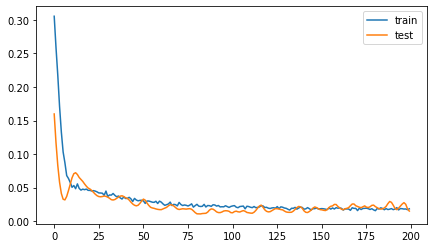

In [366]:
# reshape input to be 3D [samples, features, timesteps]
train_X = train_X.reshape((train_X.shape[0], 1, train_X.shape[1]))
test_X = test_X.reshape((test_X.shape[0], 1, test_X.shape[1]))

model = Sequential()
model.add(LSTM(20, input_shape=(train_X.shape[1], train_X.shape[2])))
model.add(Dropout(0.2))
model.add(Dense(1, activation='relu'))
# model.compile(loss='mae', optimizer=optimizer)
model.compile(loss='mean_squared_error', optimizer='adam')

# fit network
history = model.fit(train_X, train_y, 
                    epochs=EPOCHS, batch_size=64, 
                    validation_data=(test_X, test_y), 
                    verbose=2, shuffle=False)

# plot history
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.legend()
plt.show()

In [367]:
# make a prediction
yhat = model.predict(test_X)
yhat[yhat<0] = 0
yhat_train = model.predict(train_X)
yhat_train[yhat_train<0] = 0

test_X = test_X.reshape((test_X.shape[0], test_X.shape[2]))
train_X = train_X.reshape((train_X.shape[0], train_X.shape[2]))

In [368]:
# invert scaling for training
inv_yhat_train = np.concatenate((train_X, yhat_train), axis=1)
inv_yhat_train = scaler.inverse_transform(inv_yhat_train)
inv_yhat_train = inv_yhat_train[:,-1]


# invert scaling for forecast
inv_yhat = np.concatenate((test_X, yhat), axis=1)
inv_yhat = scaler.inverse_transform(inv_yhat)
inv_yhat = inv_yhat[:,-1]

# invert scaling for actual
test_y = test_y.reshape((len(test_y), 1))
inv_y = np.concatenate((test_X, test_y), axis=1)
inv_y = scaler.inverse_transform(inv_y)
inv_y = inv_y[:,-1]


# calculate RMSE
rmse = np.sqrt(mean_squared_error(inv_y, inv_yhat))
print('Test RMSE: %.3f' % rmse)
print("Actual data: ", inv_y)
print("Forecast: ",inv_yhat)

Test RMSE: 0.109
Actual data:  [-0.17907779 -0.37154955 -0.31485148 -0.15634145 -0.08742904 -0.08667551
 -0.02124831 -0.01590777  0.11586926  0.14640586  0.12189498 -0.01171878]
Forecast:  [-0.16524315 -0.25624232 -0.19498232 -0.15018326 -0.11056139  0.01938196
  0.13578125  0.23035422  0.23099515  0.20022683  0.12703817  0.03781124]


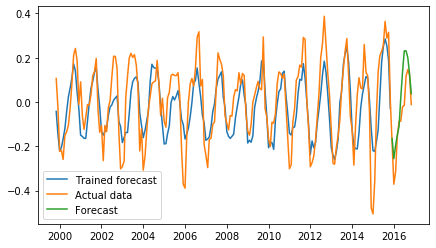

In [370]:
plt.plot(pd.Series(inv_yhat_train, index=train_val_log_add.index[:-VALIDATION_SHIFT]), label="Trained forecast")
plt.plot(train_val_log_add, label="Actual data")
plt.plot(pd.Series(inv_yhat, index=train_val_log_add.index[-VALIDATION_SHIFT:]), label="Forecast")
plt.legend()

### Conclusion over LSTM model over Log Additive decomposition:
We can see that the RMSE over the training data is bigger than the RMSE between Actual Data and the forecast.

## Conclusions of DL:
As we can see we used the best pre-processed data: Log Add Decomposed data. And we've got great results! Test data RMSE = 0.109, and We have a prediction for 2017 year!

Work was done by Sofiia Petryshyn ;)